# Abstract
## This notebook thoroughly explores feature reduction methods as a technique for saving data information as much as possible, evaluate the best method in this study case by trainig huber regression model and test on images.
---

## Objective
### - feature reduction methods:
1.  Principal Component Analysis (PCA).
2. Singular Value Decomposition (SVD).
3. Linear Discriminant Analysis (LDA).
4. Uniform Manifold Approximation and Projection (AUMAP).
5. Autoencoders.

### - Regression Modeling:
implement huber regression model for pose prediction, and compare between rather a multi-regressor model or 3 separated models.


### - Hyperparameter Tuning:
employ hyperparameter tuning to optimize its performance using Optuna.

### - Evaluation and Comparison of Models:
evaluate the performance of different feature reduction methods, comparing their effectiveness in head pose estimation tasks.

---

## Output
**Report of feature reduction methods and their performances.**
---

## import important libraries

In [1]:
%%capture
!pip install mediapipe

In [2]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 4.3 MB/s eta 0:00:00


In [3]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 5.2 MB/s eta 0:00:00


In [91]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.cluster import KMeans
import umap
import keras
from keras.models import Sequential
from keras.layers import Input, Dense
import optuna
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.metrics import mean_squared_error, r2_score
import cv2
import mediapipe as mp
import numpy as np
import matplotlib.pyplot as plt
import os,cv2,math,glob,random
import scipy.io as sio
from math import cos, sin
from pathlib import Path
import pandas as pd
import mediapipe
import warnings
warnings.filterwarnings('ignore')
from google.colab.patches import cv2_imshow

## loading the dataset

In [5]:
df = pd.read_csv('/content/face_landmarks.csv')
df

,x_0,y_0,x_1,y_1,x_2,y_2,x_3,y_3,x_4,y_4,...,y_464,x_465,y_465,x_466,y_466,x_467,y_467,pitch,yaw,roll
0,-121,139,-12,37,-109,70,-61,-86,0,0,...,-197,-90,-186,-42,-228,-37,-253,-1.108159,-1.443685,1.129171
1,52,100,7,24,43,35,-8,-75,0,0,...,-182,92,-169,275,-223,292,-244,-0.373085,0.293578,-0.125011
2,0,79,0,23,0,29,-24,-77,0,0,...,-189,46,-176,212,-244,223,-254,-0.474087,-0.040907,0.019801
3,-37,94,-4,29,-23,48,-26,-76,0,0,...,-147,26,-141,165,-161,177,-164,-0.116700,-0.233745,0.095809
4,-94,139,-8,35,-98,70,-70,-77,0,0,...,-190,-118,-178,-87,-232,-85,-247,-0.379067,-0.985426,0.086955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,-77,129,-9,31,-66,56,-45,-79,0,0,...,-182,-38,-171,48,-224,55,-238,-0.266459,-0.722653,0.219750
1849,7,105,-1,29,7,48,-11,-77,0,0,...,-158,81,-151,261,-180,275,-190,-0.161717,0.085792,0.027202
1850,52,114,2,30,43,59,6,-65,0,0,...,-134,119,-129,300,-158,322,-168,-0.046365,0.580349,-0.023616
1851,-6,134,2,27,-12,70,-38,-50,0,0,...,-114,0,-109,115,-144,125,-164,-0.948136,-1.241852,1.234426


# Functions

### Test Phots functions

In [6]:
def draw_axes(img, pitch,yaw,roll, center_point, size = 100):

    yaw = -yaw

    if center_point is None:
        height, width = img.shape[:2]
        center_point = (width / 2, height / 2)

    tdx, tdy = center_point

    # X-Axis pointing to right. drawn in red
    x1 = size * (cos(yaw) * cos(roll)) + tdx
    y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy

    # Y-Axis | drawn in green
    #        v
    x2 = size * (-cos(yaw) * sin(roll)) + tdx
    y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy

    # Z-Axis (out of the screen) drawn in blue
    x3 = size * (sin(yaw)) + tdx
    y3 = size * (-cos(yaw) * sin(pitch)) + tdy

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    cv2.line(img, (int(tdx), int(tdy)), (int(x1),int(y1)),(0,0,255),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x2),int(y2)),(0,255,0),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x3),int(y3)),(255,0,0),2)

    return img

In [117]:
def axes_prediction(img_path, feature_reduction_method):
    data = []

    faceModule = mediapipe.solutions.face_mesh

    # Loading the image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Creating a FaceMesh instance
    with faceModule.FaceMesh(static_image_mode=True) as faces:

        # Processing the face to extract the landmark points for x, y
        results = faces.process(image)

        # Checking if there are multiple face landmarks detected
        if results.multi_face_landmarks:

            # Looping over the faces in the image
                  for idx, lm in enumerate(results.multi_face_landmarks[0].landmark):
                    if idx == 4:
                      nose_x = lm.x
                      nose_y = lm.y

                    if idx == 291:
                      lower_x = lm.x
                      lower_y = lm.y

                    if idx == 33:
                      upper_x = lm.x
                      upper_y = lm.y

                  distance_x = upper_x - lower_x
                  distance_y = upper_y - lower_y
                  distance = np.sqrt(distance_x**2 + distance_y**2)
                  for face in results.multi_face_landmarks:
                      for landmark in face.landmark:
                          x = (landmark.x - nose_x) / distance
                          y = (landmark.y - nose_y) / distance
                          shape = image.shape
                          x = int(x * shape[1])
                          y = int(y * shape[0])
                          data.extend([x, y])


    # Convert data to numpy array
    dd = np.array(data).reshape(1, -1)

    if feature_reduction_method != encoder:
      dd_reduced = feature_reduction_method.transform(dd)
    else:
      dd_reduced = feature_reduction_method.predict(dd)

    pitch = pitch_model.predict(dd_reduced)
    yaw = yaw_model.predict(dd_reduced)
    roll = roll_model.predict(dd_reduced)

    h, w, c = image.shape
    center_point = (nose_x * w, nose_y * h)

    cv2_imshow(draw_axes(image, pitch, yaw, roll, center_point))

    return

### Hyper-parameter Tuning Functions

In [53]:
def optimize_huber_regressor(x, y, test_size=0.2, random_state=42, n_trials=100):
    # Split the data
    x_train, x_validation, y_train, y_validation = train_test_split(x, y, test_size=test_size, random_state=random_state)

    # Define objective function for Optuna
    def objective(trial):
        # Define hyperparameters to tune
        epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
        alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
        fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
        max_iter = trial.suggest_int('max_iter', 100, 1000)

        # Create Huber Regression model
        huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

        # Fit the model
        huber.fit(x_train, y_train)

        # Calculate validation RMSE
        validation_rmse = np.sqrt(mean_squared_error(y_validation, huber.predict(x_validation)))

        return validation_rmse

    # Create a study object and optimize the objective function
    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=n_trials)

    # Get the best hyperparameters and their corresponding objective value
    best_params = study.best_params
    best_rmse = study.best_value

    print("Best Hyperparameters:", best_params)
    print("Best Validation RMSE:", best_rmse)

    return

In [54]:
def optimize_multi_huber_regressor(x, y, test_size=0.2, random_state=42, n_trials=100):
    x_train, x_validation, y_train, y_validation = train_test_split(features, labels, test_size=0.2, random_state=42)


    # Define objective function for Optuna
    def objective(trial):
        # Define hyperparameters to tune
        epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
        alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
        fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
        max_iter = trial.suggest_int('max_iter', 100, 1000)

        # Create Huber Regression model
        huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

        # Create MultiOutputRegressor
        multi_out_huber = MultiOutputRegressor(huber)

        # Fit the model
        multi_out_huber.fit(x_train, y_train)

        # Calculate validation RMSE
        validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_huber.predict(x_validation)))

        return validation_rmse

    # Create a study object and optimize the objective function
    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=100)

    # Get the best hyperparameters and their corresponding objective value
    best_params = study.best_params
    best_rmse = study.best_value

    print("Best Hyperparameters:", best_params)
    print("Best Validation RMSE:", best_rmse)

    return

### training, prediction & Evaluation Function

In [39]:
def train_predict_evaluate(p_model, y_model, r_model, df):

    # dataframes spliting
    pitch = df[['pitch']]
    yaw = df[['yaw']]
    roll = df[['roll']]
    features = df.drop(['pitch', 'yaw', 'roll'], axis=1)

    pitch_features_train, pitch_features_validation, pitch_train, pitch_validation = train_test_split(features, pitch, test_size=0.2, random_state=42)
    yaw_features_train, yaw_features_validation, yaw_train, yaw_validation = train_test_split(features, yaw, test_size=0.2, random_state=42)
    roll_features_train, roll_features_validation, roll_train, roll_validation = train_test_split(features, roll, test_size=0.2, random_state=42)

    # train 3 models
    pitch_model = p_model.fit(pitch_features_train, pitch_train)
    yaw_model = y_model.fit(yaw_features_train, yaw_train)
    roll_model = r_model.fit(roll_features_train, roll_train)

    # Make predictions
    pitch_pred_train = pitch_model.predict(pitch_features_train)
    pitch_pred_test = pitch_model.predict(pitch_features_validation)

    yaw_pred_train = yaw_model.predict(yaw_features_train)
    yaw_pred_test = yaw_model.predict(yaw_features_validation)

    roll_pred_train = roll_model.predict(roll_features_train)
    roll_pred_test = roll_model.predict(roll_features_validation)

    # Evaluate the model
    mse_train_pitch = mean_squared_error(pitch_train, pitch_pred_train)
    mse_test_pitch = mean_squared_error(pitch_validation, pitch_pred_test)
    r2_train_pitch = r2_score(pitch_train, pitch_pred_train)
    r2_test_pitch = r2_score(pitch_validation, pitch_pred_test)

    mse_train_yaw = mean_squared_error(yaw_train, yaw_pred_train)
    mse_test_yaw = mean_squared_error(yaw_validation, yaw_pred_test)
    r2_train_yaw = r2_score(yaw_train, yaw_pred_train)
    r2_test_yaw = r2_score(yaw_validation, yaw_pred_test)

    mse_train_roll = mean_squared_error(roll_train, roll_pred_train)
    mse_test_roll = mean_squared_error(roll_validation, roll_pred_test)
    r2_train_roll = r2_score(roll_train, roll_pred_train)
    r2_test_roll = r2_score(roll_validation, roll_pred_test)


    # Print evaluation metrics
    print('Pitch Evaluation')
    print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_pitch, mse_test_pitch))
    print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_pitch, r2_test_pitch))
    print('\n')
    print('Yaw Evaluation')
    print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_yaw, mse_test_yaw))
    print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_yaw, r2_test_yaw))
    print('\n')
    print('Roll Evaluation')
    print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_roll, mse_test_roll))
    print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_roll, r2_test_roll))

# Principal Component Analysis (PCA).

###Principal Component Analysis (PCA) [see doc](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) is a statistical technique used for dimensionality reduction. It transforms a large set of variables into a smaller one that still contains most of the information in the large set. <br>

##Key Concepts:
- **Dimensionality Reduction:** PCA reduces the number of variables (or dimensions) in your dataset while preserving as much variance (information) as possible.

- **Principal Components:** These are new variables created by PCA. They are linear combinations of the original variables and are orthogonal (uncorrelated) to each other.
- **Variance:** PCA aims to capture the maximum variance in the data with the fewest number of principal components.
- **Eigenvectors and Eigenvalues:** PCA uses eigenvectors and eigenvalues of the covariance matrix of the data. Eigenvectors determine the direction of the new feature space, and eigenvalues determine their magnitude (i.e., the importance of each principal component).

##PCA Steps:
- **Standardization:** Standardize the dataset so that each feature has a mean of 0 and a standard deviation of 1. This step is crucial because PCA is affected by the scale of the data.

- **Covariance Matrix Computation:** Compute the covariance matrix to understand how the variables of the input data are varying from the mean with respect to each other.
- **Eigenvectors and Eigenvalues:** Compute the eigenvectors and eigenvalues of the covariance matrix. The eigenvectors (principal components) are the directions of maximum variance, and the eigenvalues represent the magnitude of the variance in the direction of the eigenvector.
- **Sort Eigenvalues and Eigenvectors:** Sort the eigenvalues and their corresponding eigenvectors in descending order. This order determines the principal components' significance.
- **Projection onto Principal Components:** Select the top k eigenvectors (where k is the number of dimensions you want to keep) and project the original data onto these eigenvectors. This step transforms the original data into a new subspace with reduced dimensions.

##PCA Appliction:
- **Data Visualization:** Reducing high-dimensional data to 2 or 3 dimensions to visualize patterns and relationships.

- **Noise Reduction:** Removing less significant components that may be considered as noise.
- **Feature Extraction:** Identifying the most important features that capture the essence of the data.
- **Compression:** Reducing the number of features while retaining most of the original information.

In [30]:
# Separate features and target
features = df.drop(columns=['pitch', 'yaw', 'roll'])
targets = df[['pitch', 'yaw', 'roll']]

# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Apply PCA
pca = PCA(n_components=0.95)  # Retain 95% of the variance
features_pca = pca.fit_transform(features_scaled)

# Create a new DataFrame with the principal components
features_pca_df = pd.DataFrame(features_pca, columns=[f'PC{i+1}' for i in range(features_pca.shape[1])])

# Combine the PCA features with the target variables
pca_df = pd.concat([features_pca_df, targets.reset_index(drop=True)], axis=1)
pca_df

,PC1,PC2,PC3,PC4,pitch,yaw,roll
0,-40.955484,-3.623690,1.538765,-24.130627,-1.108159,-1.443685,1.129171
1,14.975742,8.856490,16.767499,1.059075,-0.373085,0.293578,-0.125011
2,-3.837582,9.547600,23.801288,1.422543,-0.474087,-0.040907,0.019801
3,-11.721414,-4.242806,9.126711,1.325426,-0.116700,-0.233745,0.095809
4,-41.036574,3.008716,-7.555795,-21.134323,-0.379067,-0.985426,0.086955
...,...,...,...,...,...,...,...
1848,-27.232752,-0.650468,5.330669,-13.326263,-0.266459,-0.722653,0.219750
1849,4.276921,-0.824672,11.661406,1.093336,-0.161717,0.085792,0.027202
1850,20.349881,-0.489415,-2.769786,3.035733,-0.046365,0.580349,-0.023616
1851,-7.567522,-0.353555,-15.989242,-0.786599,-0.948136,-1.241852,1.234426


## Hyper-paramter Tuning


In [51]:
# dataframe spliting
pitch = pca_df[['pitch']]
yaw = pca_df[['yaw']]
roll = pca_df[['roll']]
features = pca_df.drop(['pitch', 'yaw', 'roll'], axis=1)
labels = pca_df[['pitch', 'yaw', 'roll']]

- pitch model tuning

In [55]:
optimize_huber_regressor(features, pitch, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:55:09,202] A new study created in memory with name: no-name-cd14c7a1-2fbf-4313-bab6-2ac3baf153cd
[I 2024-06-02 08:55:09,226] Trial 0 finished with value: 0.18401765527015096 and parameters: {'epsilon': 1.9241288968413288, 'alpha': 35.242040995553154, 'fit_intercept': False, 'max_iter': 714}. Best is trial 0 with value: 0.18401765527015096.
[I 2024-06-02 08:55:09,247] Trial 1 finished with value: 0.14826383384273678 and parameters: {'epsilon': 1.2048263079793053, 'alpha': 106.9532351962803, 'fit_intercept': True, 'max_iter': 862}. Best is trial 1 with value: 0.14826383384273678.
[I 2024-06-02 08:55:09,270] Trial 2 finished with value: 0.148076384585528 and parameters: {'epsilon': 1.6669163571164018, 'alpha': 0.003544459524043124, 'fit_intercept': True, 'max_iter': 112}. Best is trial 2 with value: 0.148076384585528.
[I 2024-06-02 08:55:09,288] Trial 3 finished with value: 0.18462770495135264 and parameters: {'epsilon': 1.3538694328464087, 'alpha': 16.558312561927764, 'f

Best Hyperparameters: {'epsilon': 1.6122300770873497, 'alpha': 0.0013514338350808803, 'fit_intercept': True, 'max_iter': 145}
Best Validation RMSE: 0.1480700250348551


- yaw model tuning

In [56]:
optimize_huber_regressor(features, yaw, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:55:18,163] A new study created in memory with name: no-name-c7dd92c0-79ee-490a-b0c8-e954a68e5d04
[I 2024-06-02 08:55:18,186] Trial 0 finished with value: 0.13686439526470864 and parameters: {'epsilon': 1.9053187892709917, 'alpha': 18.711984365537873, 'fit_intercept': True, 'max_iter': 509}. Best is trial 0 with value: 0.13686439526470864.
[I 2024-06-02 08:55:18,207] Trial 1 finished with value: 0.1368552929645067 and parameters: {'epsilon': 1.9147359420587056, 'alpha': 87.12646774046107, 'fit_intercept': True, 'max_iter': 484}. Best is trial 1 with value: 0.1368552929645067.
[I 2024-06-02 08:55:18,228] Trial 2 finished with value: 0.1383413276365982 and parameters: {'epsilon': 1.2545058665818205, 'alpha': 0.633042213004567, 'fit_intercept': True, 'max_iter': 979}. Best is trial 1 with value: 0.1368552929645067.
[I 2024-06-02 08:55:18,247] Trial 3 finished with value: 0.13689356810175488 and parameters: {'epsilon': 1.8769242511844615, 'alpha': 0.03801042150628901, 'fit_

Best Hyperparameters: {'epsilon': 1.9998160075200395, 'alpha': 8.526616411107135, 'fit_intercept': True, 'max_iter': 607}
Best Validation RMSE: 0.1367736916137538


- roll model tuning

In [57]:
optimize_huber_regressor(features, roll, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:55:27,249] A new study created in memory with name: no-name-761dc9d8-904c-4561-8c86-d1ebd65ed8b0
[I 2024-06-02 08:55:27,272] Trial 0 finished with value: 0.16264345408996717 and parameters: {'epsilon': 1.7779396198488966, 'alpha': 715.8596830746507, 'fit_intercept': False, 'max_iter': 433}. Best is trial 0 with value: 0.16264345408996717.
[I 2024-06-02 08:55:27,290] Trial 1 finished with value: 0.1630787416000931 and parameters: {'epsilon': 1.5264055827507543, 'alpha': 392.3382553857979, 'fit_intercept': False, 'max_iter': 382}. Best is trial 0 with value: 0.16264345408996717.
[I 2024-06-02 08:55:27,307] Trial 2 finished with value: 0.16269717112429274 and parameters: {'epsilon': 1.7319501827975543, 'alpha': 0.0019493905434091368, 'fit_intercept': False, 'max_iter': 600}. Best is trial 0 with value: 0.16264345408996717.
[I 2024-06-02 08:55:27,327] Trial 3 finished with value: 0.16240837654565318 and parameters: {'epsilon': 1.9160079457307564, 'alpha': 0.014245069248346

Best Hyperparameters: {'epsilon': 1.9999651737219661, 'alpha': 0.07931707102296229, 'fit_intercept': False, 'max_iter': 453}
Best Validation RMSE: 0.1622678062341358


- multi regressor model tuning

In [58]:
optimize_multi_huber_regressor(features, labels, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:55:33,767] A new study created in memory with name: no-name-98c7975b-30ce-41ea-8333-53df393ecbba
[I 2024-06-02 08:55:34,041] Trial 0 finished with value: 0.15012208719950298 and parameters: {'epsilon': 1.635138233648808, 'alpha': 0.017403449647190074, 'fit_intercept': True, 'max_iter': 326}. Best is trial 0 with value: 0.15012208719950298.
[I 2024-06-02 08:55:34,198] Trial 1 finished with value: 0.16254117232571552 and parameters: {'epsilon': 1.8538765308526555, 'alpha': 0.0010398471712078623, 'fit_intercept': False, 'max_iter': 216}. Best is trial 0 with value: 0.15012208719950298.
[I 2024-06-02 08:55:34,344] Trial 2 finished with value: 0.16248781930298548 and parameters: {'epsilon': 1.9074644928802469, 'alpha': 294.5239374314108, 'fit_intercept': False, 'max_iter': 484}. Best is trial 0 with value: 0.15012208719950298.
[I 2024-06-02 08:55:34,542] Trial 3 finished with value: 0.15084473979802737 and parameters: {'epsilon': 1.1663835913614515, 'alpha': 0.0370188579838

Best Hyperparameters: {'epsilon': 1.9999237270733887, 'alpha': 0.11223845588239208, 'fit_intercept': True, 'max_iter': 740}
Best Validation RMSE: 0.1496587489708338


## `performance is quite the same whether time or RMSE evaluation, and quite the same for other feature selectiontechniques we used before`

## Test on photos

In [40]:
# initialize 3 models
pitch_model = HuberRegressor(epsilon=1.610148990551271, alpha=0.10057327709587784, fit_intercept=True, max_iter=125)
yaw_model = HuberRegressor(epsilon=1.9999776201087625, alpha=3.886229181215661, fit_intercept=True, max_iter=371)
roll_model = HuberRegressor(epsilon=1.9998819005419795, alpha=0.02233007065789589, fit_intercept=False, max_iter=299)

train_predict_evaluate(pitch_model, yaw_model, roll_model, pca_df)

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.3080, Test: 0.0219
R-squared (R2) - Train: 0.1376, Test: 0.7236


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.0552, Test: 0.0187
R-squared (R2) - Train: 0.8376, Test: 0.9410


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.3799, Test: 0.0263
R-squared (R2) - Train: 0.2369, Test: 0.7704


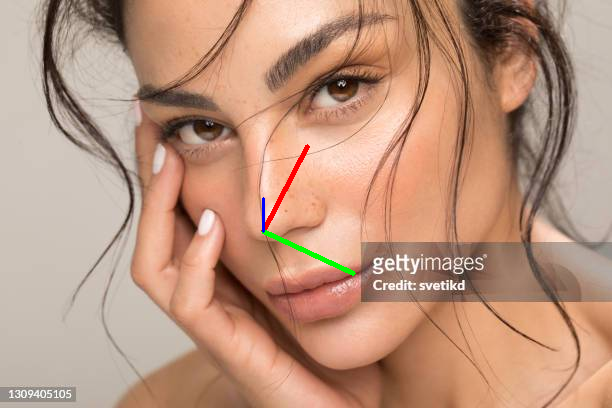

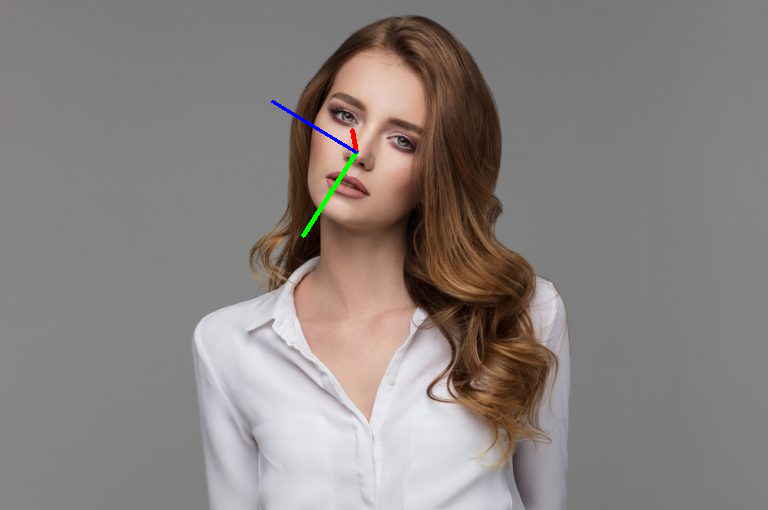

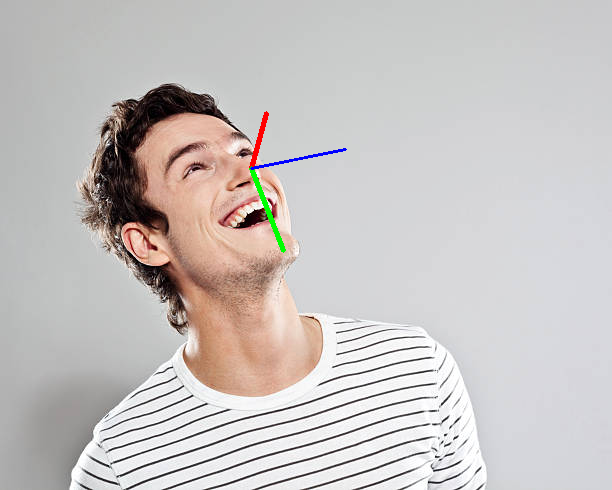

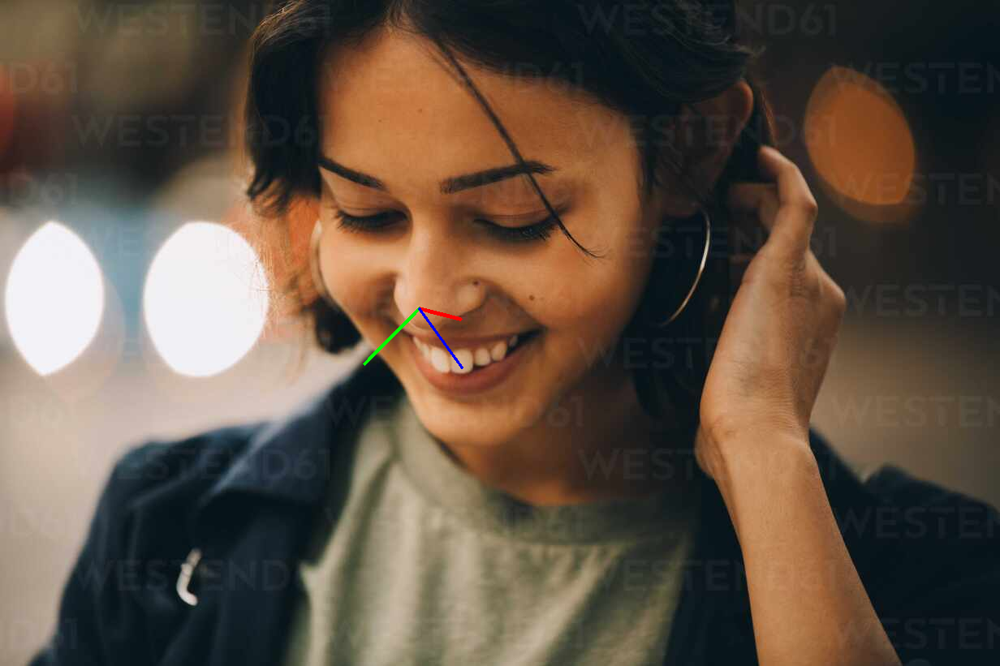

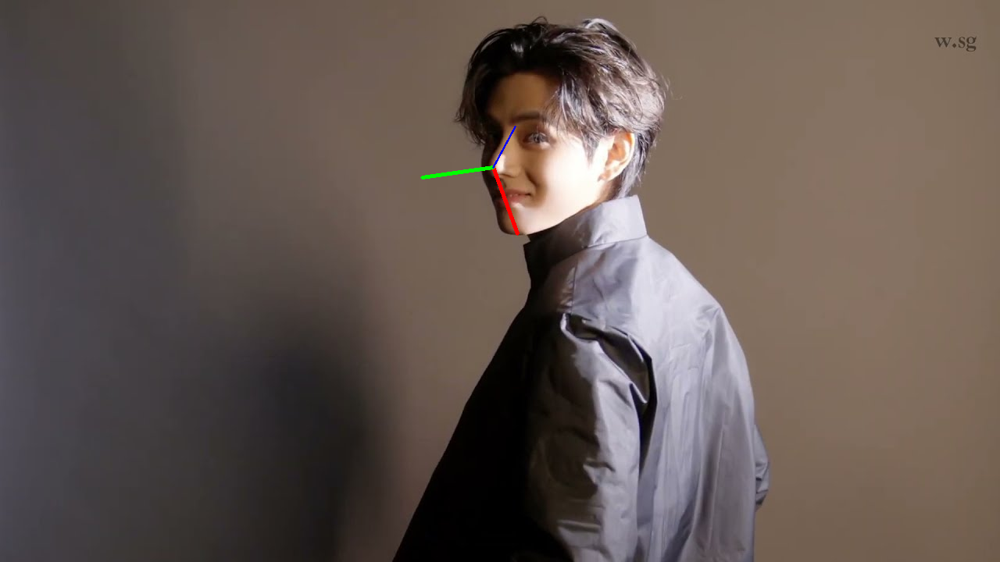

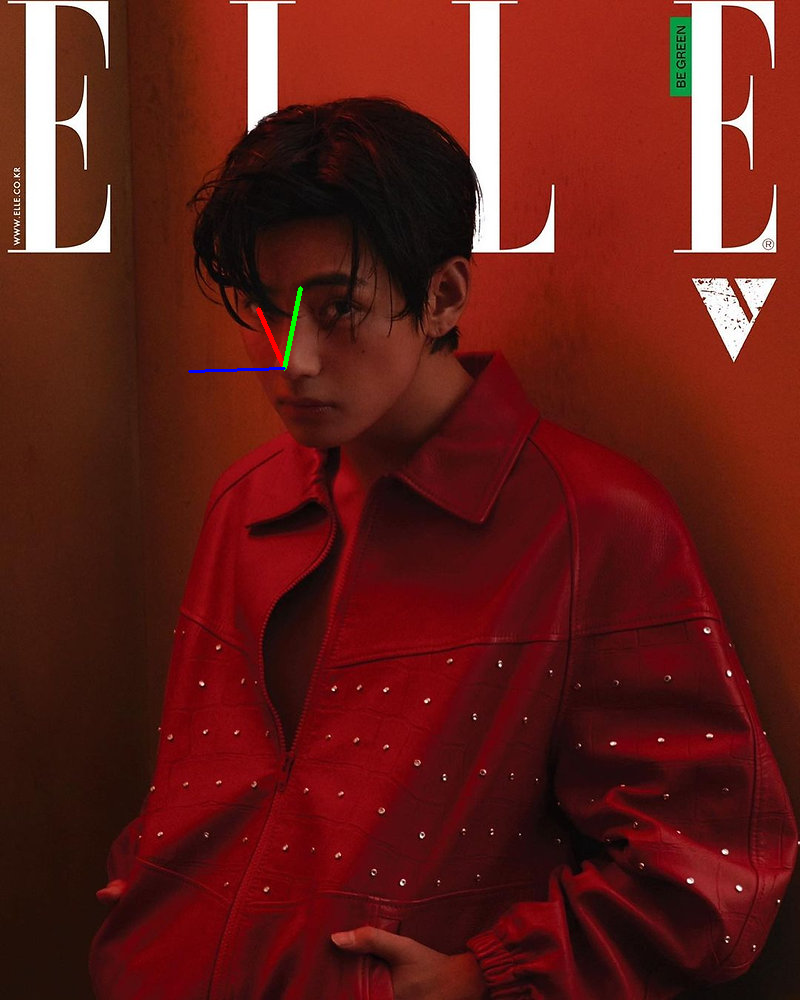

In [41]:
feature_reduction_method = pca
for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    axes_prediction(img_path, feature_reduction_method=feature_reduction_method)

## `It's clear that axes are missed up`

## PCA Drawbacks
- **Non-Linear Data**

`Issue:` PCA assumes linear relationships between features and may not capture the underlying structure of data that has non-linear relationships.

`Example:` If your data has complex, non-linear relationships (like those often found in image or audio data), PCA might not be able to effectively reduce dimensions while preserving important information.
<br>
<br>
- **Interpretable Features Required**

`Issue:` PCA transforms the original features into principal components, which are linear combinations of the original features. These new components are not easily interpretable.

`Example:` In cases where feature interpretability is crucial, such as in some medical or financial applications where stakeholders need to understand the impact of each feature, PCA may not be suitable.
<br>
<br>

- **Low Variance in Data**

`Issue:` PCA works by maximizing variance. If the features do not have significant variance, PCA will not be effective in distinguishing between important and less important features.

`Example:` When the dataset contains features with very low variance, PCA might not provide meaningful principal components.
<br>
<br>

- **Presence of Noise**

`Issue:` PCA is sensitive to noise in the data. Noise can distort the principal components and lead to misleading results.

`Example:` In datasets with high levels of noise, the principal components might capture noise rather than the underlying structure of the data.
<br>
<br>
- **Different Scales of Features**

`Issue:` PCA is sensitive to the scale of the features. If the features have different units or scales, the resulting principal components may be dominated by features with larger scales.

`Example:` In datasets where features are on different scales (e.g., age in years vs. income in dollars), it's essential to standardize the data before applying PCA. Without standardization, PCA will give more importance to features with larger scales.
<br>
<br>
- **Sparse Data**

`Issue:` PCA may not work well with sparse data because it relies on the covariance matrix, which can be dominated by zero entries in sparse datasets.

`Example:` Text data represented as a sparse matrix (e.g., term-frequency or TF-IDF matrices) might not be suitable for PCA.
<br>
<br>
- **Large Number of Features Relative to Samples**

`Issue:` If the number of features is much larger than the number of samples, PCA might overfit and not generalize well.

`Example:` In high-dimensional datasets with few samples (such as gene expression data), PCA might not effectively reduce dimensionality without losing significant information.
<br>
<br>
- **Presence of Outliers**

`Issue:` PCA is sensitive to outliers, which can skew the principal components and distort the representation of the data.

`Example:` In datasets with significant outliers, the principal components might be heavily influenced by these outliers rather than the underlying structure of the majority of the data.

#Truncated Singular Value Decomposition (Truncated SVD)
###Truncated SVD [see doc](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html), also known as Latent Semantic Analysis (LSA) when applied to text data, is a dimensionality reduction technique particularly useful for sparse data such as term-document matrices in natural language processing. It is a variant of Singular Value Decomposition (SVD) that only computes the largest singular values and their corresponding singular vectors.
<br>

##Key Concepts
- **Singular Value Decomposition (SVD):**
SVD decomposes a matrix 𝐴 into three matrices: 𝑈, Σ, and 𝑉 𝑇ranspose, such that 𝐴 = 𝑈 @ Σ 𝑉 𝑇ranspose. 𝑈 and 𝑉 𝑇ranspose are orthogonal matrices, and Σ is a diagonal matrix with singular values.

- **Truncation:**
Truncated SVD only retains the top 𝑘 singular values and corresponding singular vectors, reducing the dimensionality of the data.

- **Dimensionality Reduction:**
By retaining only the top 𝑘 components, Truncated SVD captures the most significant features of the data, thus reducing its dimensionality while preserving as much of the original structure as possible.
<br>

##SVD Steps
- **Construct the Term-Document Matrix (for text data):**
Create a matrix where rows represent documents and columns represent terms (words). The matrix entries typically represent term frequency or TF-IDF values.

- **Apply SVD:**
Perform SVD on the matrix to obtain 𝑈, Σ and 𝑉 𝑇ranspose.

- **Truncate the Matrices:**
Retain only the top 𝑘 singular values in Σ and the corresponding columns in 𝑈 and 𝑉 𝑇ranspose.

- **Transform the Data:**
Use the truncated matrices to transform the original data into a lower-dimensional space.
<br>

##SVD Applications
- **Text Data:**
Commonly used for topic modeling, document clustering, and information retrieval in natural language processing.

- **Recommendation Systems:**
Used for collaborative filtering and reducing the dimensionality of user-item interaction matrices.

- **Image Compression:**
Reduces the storage and computational requirements by compressing image data.

In [59]:
# Separate features and targets
X = df.drop(columns=['pitch', 'yaw', 'roll'])
y = df[['pitch', 'yaw', 'roll']]

# Apply Truncated SVD for dimensionality reduction
n_components = 25  # Number of components to keep; adjust based on your requirements
svd = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = svd.fit_transform(X)

In [60]:
# Create a new DataFrame with the SVD components
features_svd_df = pd.DataFrame(X_reduced, columns=[f'SVD{i+1}' for i in range(X_reduced.shape[1])])

# Combine the PCA features with the target variables
svd_df = pd.concat([features_svd_df, y.reset_index(drop=True)], axis=1)
svd_df

,SVD1,SVD2,SVD3,SVD4,SVD5,SVD6,SVD7,SVD8,SVD9,SVD10,...,SVD19,SVD20,SVD21,SVD22,SVD23,SVD24,SVD25,pitch,yaw,roll
0,5119.074081,-5021.399208,-523.787026,333.540004,871.955965,425.619427,-43.168622,-219.182176,-81.716570,26.556698,...,-19.021934,11.268049,5.580251,-6.364049,5.886777,24.596735,-22.837518,-1.108159,-1.443685,1.129171
1,4847.627160,1712.015579,410.813510,1061.227461,-76.804886,-210.517083,-91.584607,99.773869,41.340368,16.104846,...,-2.538106,3.988232,-15.786654,3.353302,-12.489374,-16.688706,16.972941,-0.373085,0.293578,-0.125011
2,4824.601191,-298.256196,148.146814,1439.987067,-390.503693,48.283567,-130.319030,9.412081,-14.963269,0.141110,...,-0.199458,0.251600,-41.545208,6.466924,-0.205879,14.011627,19.059836,-0.474087,-0.040907,0.019801
3,4733.537620,-1287.190569,-547.515193,305.850108,-402.305197,63.506824,280.863129,-111.227135,-30.584714,89.153741,...,2.680325,7.062604,1.062493,-7.664967,-13.785424,-6.292128,-5.434470,-0.116700,-0.233745,0.095809
4,4837.600044,-5154.163832,194.471195,-83.457588,915.341864,293.174050,-112.780420,-86.397587,44.059317,-85.430860,...,-12.964633,15.721566,16.946281,4.778474,8.854500,20.138202,2.544942,-0.379067,-0.985426,0.086955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,4820.067047,-3272.525847,-343.778466,513.961619,439.638140,325.049385,-108.312908,8.141457,25.171053,-1.624018,...,13.090798,23.158295,-26.547403,3.521369,-3.155936,5.462862,-2.127941,-0.266459,-0.722653,0.219750
1849,4896.716515,504.945199,-332.998602,562.329060,-359.572684,9.808849,-58.665714,-59.514058,-19.823108,-51.893617,...,15.289498,-7.700261,-4.883315,-0.522927,7.927335,4.253729,1.361859,-0.161717,0.085792,0.027202
1850,4959.415997,2179.765558,48.424540,-316.018562,-220.963224,-20.150523,294.870141,-39.643430,3.541284,-152.411154,...,15.211328,10.172170,-8.122715,22.991567,6.221900,13.734216,-7.763475,-0.046365,0.580349,-0.023616
1851,4734.435800,-1148.806649,433.127109,-814.338037,90.501796,-158.037943,13.160390,-32.813661,-69.699804,50.039573,...,-25.429440,22.761182,-28.560544,27.303204,-16.775435,12.773071,2.408405,-0.948136,-1.241852,1.234426


## Hyper-paramter tuning

In [61]:
# dataframe spliting
pitch = svd_df[['pitch']]
yaw = svd_df[['yaw']]
roll = svd_df[['roll']]
features = svd_df.drop(['pitch', 'yaw', 'roll'], axis=1)
labels = svd_df[['pitch', 'yaw', 'roll']]

- pitch model tuning

In [62]:
optimize_huber_regressor(features, pitch, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:56:03,102] A new study created in memory with name: no-name-9ed043d8-c9d8-4ac5-9cfb-ae1b70224fb6
[I 2024-06-02 08:56:04,279] Trial 0 finished with value: 0.13601497712910046 and parameters: {'epsilon': 1.7930748161838177, 'alpha': 4.380625677266131, 'fit_intercept': False, 'max_iter': 860}. Best is trial 0 with value: 0.13601497712910046.
[I 2024-06-02 08:56:05,428] Trial 1 finished with value: 0.13778884155855078 and parameters: {'epsilon': 1.2900850791669716, 'alpha': 11.716928730376862, 'fit_intercept': False, 'max_iter': 769}. Best is trial 0 with value: 0.13601497712910046.
[I 2024-06-02 08:56:05,662] Trial 2 finished with value: 0.15131994057160786 and parameters: {'epsilon': 1.9560478904422558, 'alpha': 0.020429287956221183, 'fit_intercept': False, 'max_iter': 144}. Best is trial 0 with value: 0.13601497712910046.
[I 2024-06-02 08:56:06,393] Trial 3 finished with value: 0.187876624308183 and parameters: {'epsilon': 1.5377784537218835, 'alpha': 1.2197572260302483

Best Hyperparameters: {'epsilon': 1.966611618060607, 'alpha': 37.745568811184356, 'fit_intercept': True, 'max_iter': 767}
Best Validation RMSE: 0.13352714918216


- yaw model tuning

In [63]:
optimize_huber_regressor(features, yaw, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:57:17,843] A new study created in memory with name: no-name-1317f1c8-b6c0-41d1-9a0c-46a3b7d5a658
[I 2024-06-02 08:57:17,981] Trial 0 finished with value: 0.15308580839618297 and parameters: {'epsilon': 1.1636239836393987, 'alpha': 3.8550277190405287, 'fit_intercept': False, 'max_iter': 212}. Best is trial 0 with value: 0.15308580839618297.
[I 2024-06-02 08:57:18,606] Trial 1 finished with value: 0.12907705428767716 and parameters: {'epsilon': 1.3180420302560982, 'alpha': 0.9779279253391086, 'fit_intercept': False, 'max_iter': 908}. Best is trial 1 with value: 0.12907705428767716.
[I 2024-06-02 08:57:18,771] Trial 2 finished with value: 0.15327205300250757 and parameters: {'epsilon': 1.538902228603466, 'alpha': 4.407436829224835, 'fit_intercept': True, 'max_iter': 202}. Best is trial 1 with value: 0.12907705428767716.
[I 2024-06-02 08:57:19,230] Trial 3 finished with value: 0.13496806726215196 and parameters: {'epsilon': 1.5401587182926906, 'alpha': 249.96827956573176, 

Best Hyperparameters: {'epsilon': 1.9207287282918613, 'alpha': 0.007209739713335392, 'fit_intercept': True, 'max_iter': 957}
Best Validation RMSE: 0.12600623579555867


- roll model tuning

In [64]:
optimize_huber_regressor(features, roll, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:58:31,069] A new study created in memory with name: no-name-12309632-c7eb-4719-a048-2a97aab4dbaa
[I 2024-06-02 08:58:31,264] Trial 0 finished with value: 0.2517919758538919 and parameters: {'epsilon': 1.9552382903554695, 'alpha': 0.2746892812531196, 'fit_intercept': True, 'max_iter': 252}. Best is trial 0 with value: 0.2517919758538919.
[I 2024-06-02 08:58:31,745] Trial 1 finished with value: 0.1403235892093767 and parameters: {'epsilon': 1.4851161493627378, 'alpha': 0.0010245419569411634, 'fit_intercept': True, 'max_iter': 671}. Best is trial 1 with value: 0.1403235892093767.
[I 2024-06-02 08:58:32,288] Trial 2 finished with value: 0.13973784129930256 and parameters: {'epsilon': 1.8232624456036945, 'alpha': 88.51375759419996, 'fit_intercept': True, 'max_iter': 774}. Best is trial 2 with value: 0.13973784129930256.
[I 2024-06-02 08:58:32,497] Trial 3 finished with value: 0.3605946044128211 and parameters: {'epsilon': 1.2869379121791122, 'alpha': 11.210109753733732, 'fi

Best Hyperparameters: {'epsilon': 1.1917333819077818, 'alpha': 0.002489106558932834, 'fit_intercept': False, 'max_iter': 696}
Best Validation RMSE: 0.13732828230005653


- multi-model tuning

In [65]:
optimize_multi_huber_regressor(features, labels, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 08:59:38,825] A new study created in memory with name: no-name-0578e1ba-620d-4aef-bb9d-7bf529ec13f6
[I 2024-06-02 08:59:39,153] Trial 0 finished with value: 0.1676988616175543 and parameters: {'epsilon': 1.4961629113703672, 'alpha': 92.22609683629423, 'fit_intercept': True, 'max_iter': 157}. Best is trial 0 with value: 0.1676988616175543.
[I 2024-06-02 08:59:39,816] Trial 1 finished with value: 0.33238006555210564 and parameters: {'epsilon': 1.2929714972234407, 'alpha': 0.019595986720287575, 'fit_intercept': False, 'max_iter': 332}. Best is trial 0 with value: 0.1676988616175543.
[I 2024-06-02 08:59:40,447] Trial 2 finished with value: 0.26145623415856023 and parameters: {'epsilon': 1.2741223155646335, 'alpha': 14.486400984458383, 'fit_intercept': False, 'max_iter': 305}. Best is trial 0 with value: 0.1676988616175543.
[I 2024-06-02 08:59:42,076] Trial 3 finished with value: 0.137583227239428 and parameters: {'epsilon': 1.3647870529676331, 'alpha': 48.8763084437315, 'fit_

Best Hyperparameters: {'epsilon': 1.8875916672790878, 'alpha': 130.63275306389636, 'fit_intercept': True, 'max_iter': 858}
Best Validation RMSE: 0.13397621460489217


### `SVD has a smaller RMES than PCA over all put it's slower`

## Test on photos

In [66]:
# initialize 3 models
pitch_model = HuberRegressor(epsilon=1.8066077821175526, alpha=0.023951645104087906, fit_intercept=False, max_iter=710)
yaw_model = HuberRegressor(epsilon=1.4232261821453653, alpha=461.0863142259258, fit_intercept=True, max_iter=899)
roll_model = HuberRegressor(epsilon=1.9305294184274266, alpha=676.301562104766, fit_intercept=True, max_iter=829)

train_predict_evaluate(pitch_model, yaw_model, roll_model, svd_df)

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.3040, Test: 0.0177
R-squared (R2) - Train: 0.1488, Test: 0.7768


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.0519, Test: 0.0167
R-squared (R2) - Train: 0.8473, Test: 0.9473


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.3802, Test: 0.0198
R-squared (R2) - Train: 0.2364, Test: 0.8276


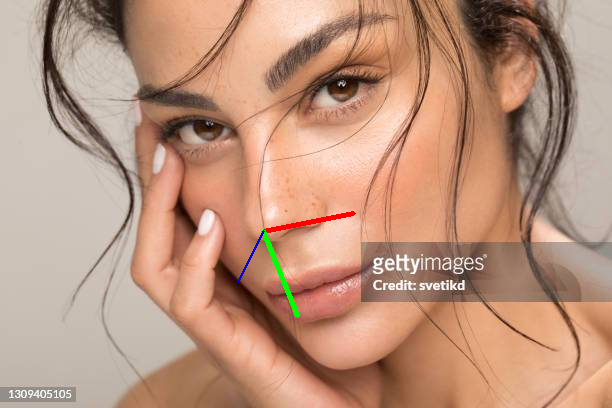

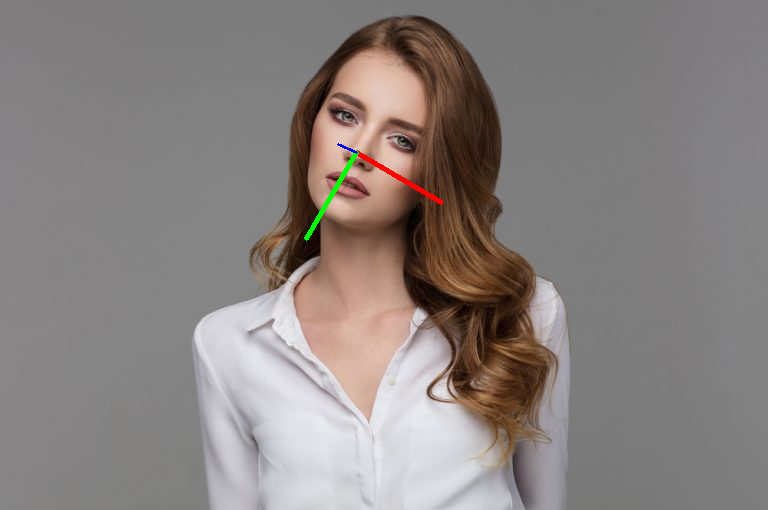

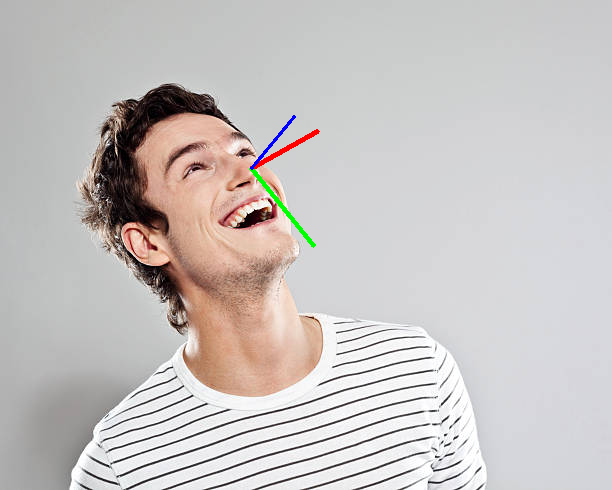

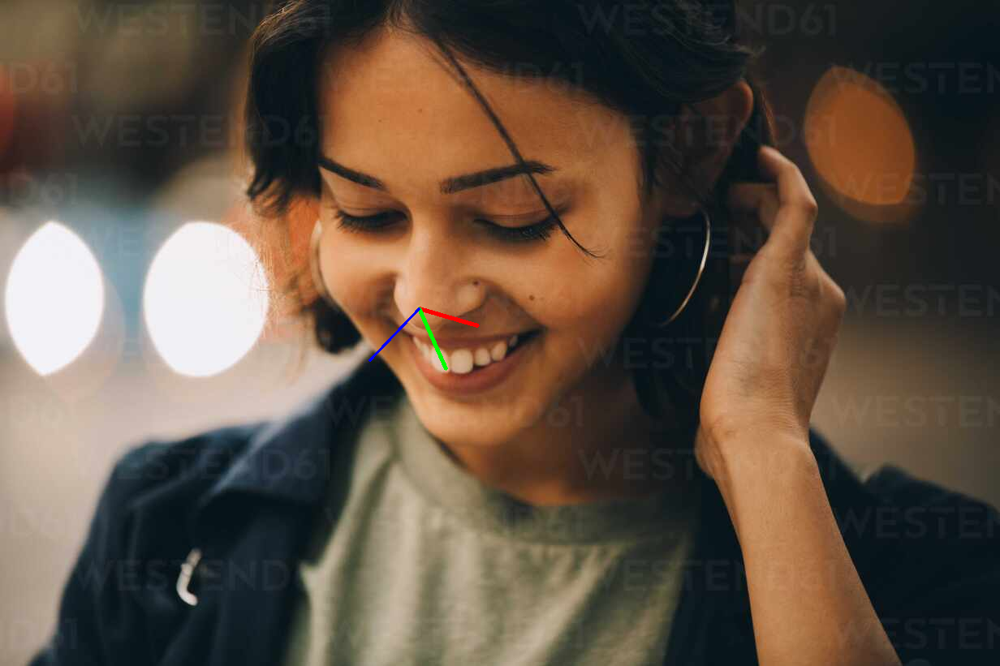

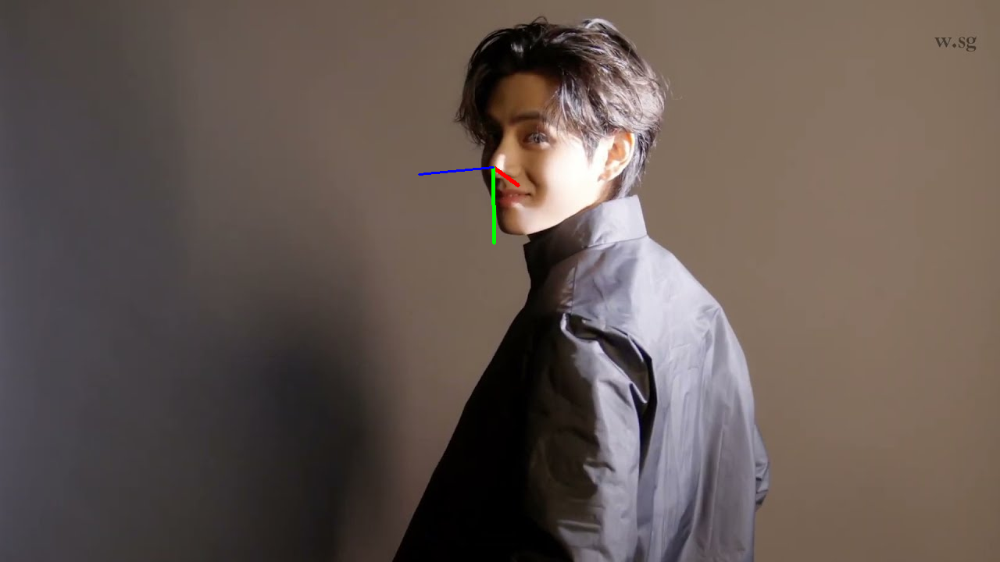

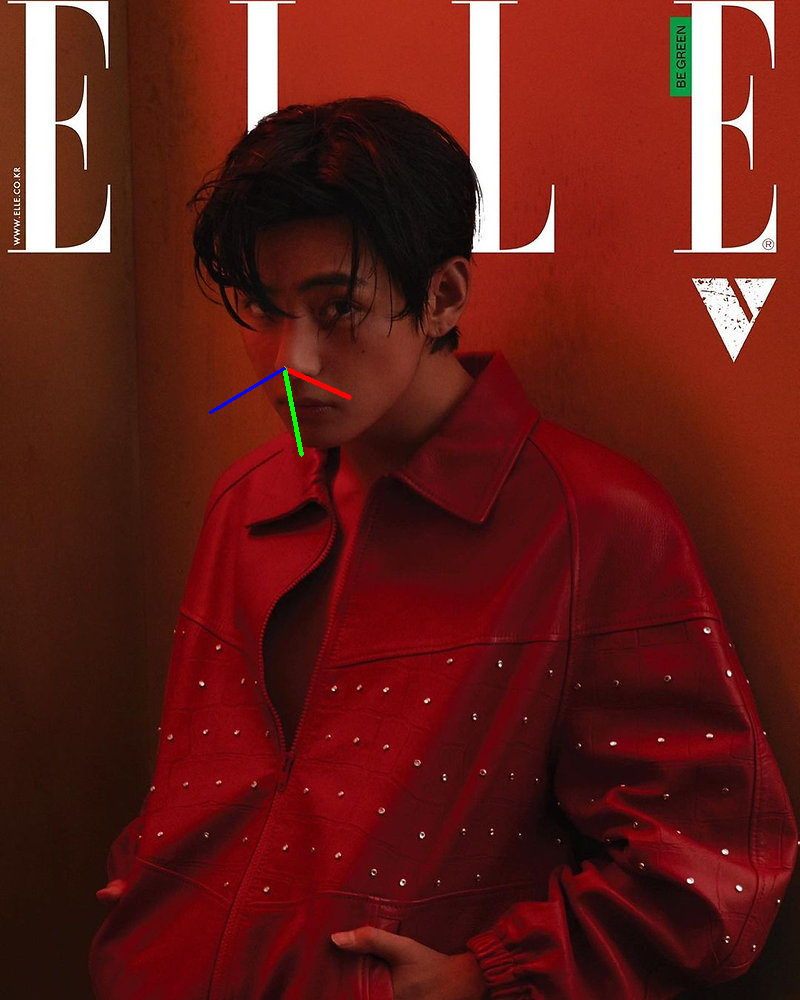

In [68]:
feature_reduction_method = svd

for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    axes_prediction(img_path, feature_reduction_method=feature_reduction_method)

## `SVD is much better than PCA in this study case.`

## SVD Drawbacks
- **Interpretability:**
The resulting components (features) may not be easily interpretable, especially in the context of text data.

- **Computational Complexity:**
Although truncated SVD is more efficient than full SVD, it can still be computationally intensive for very large datasets.

- **Loss of Information:**
Some information is inevitably lost during the truncation process, which can impact the performance of subsequent models if the number of retained components 𝑘 is too low.

- **Sensitivity to Noise:**
SVD can be sensitive to noise in the data, which might affect the quality of the reduced representation.

# Linear Discriminant Analysis (LDA).
###Linear Discriminant Analysis (LDA) [see doc](https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html) is a popular technique used in statistics, pattern recognition, and machine learning for dimensionality reduction while preserving as much of the class discriminatory information as possible.
<br>

##Key Concepts
- **Dimensionality Reduction:** LDA reduces the number of features in a dataset while maintaining the class discriminative information.

- **Discriminant Analysis:** It seeks to project data in a way that maximizes the separation between multiple classes.
- **Class Separation:** LDA aims to find a linear combination of features that best separates two or more classes.
<br>

### LDA Steps
- **Compute the Mean Vectors:** For each class, compute the mean vector of each feature.

- **Compute the Scatter Matrices:** <br>
`Within-Class Scatter Matrix (S_w):` Measures the scatter (variance) within each class.<br>
`Between-Class Scatter Matrix (S_b):` Measures the scatter between the class means.

- **Compute the Discriminant Function:** Solve the generalized eigenvalue problem for the matrix transverse(S_w) @ S_b, this gives the linear discriminants.
- **Select Linear Discriminants for the New Feature Subspace:** Choose the top k eigenvectors corresponding to the largest eigenvalues to form a new feature subspace.
- **Project the Data:** Transform the original dataset onto this new subspace.
<br>

### LDA Applications
- **Face Recognition:** LDA is used to project high-dimensional face images onto a lower-dimensional subspace, improving classification performance.

- **Medical Diagnosis:** LDA helps in distinguishing between different medical conditions based on patient data.
- **Finance:** It is used to predict stock price movements by reducing the complexity of financial data.
- **Marketing:** LDA can be used to segment customers based on their purchasing behavior.

In [69]:
# Separate features and targets
X = df.drop(['pitch', 'yaw', 'roll'], axis=1)
y = df[['pitch', 'yaw', 'roll']]

# Normalize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Combine target columns using KMeans
n_clusters = 3  # Number of clusters for combining target variables
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
y_combined = kmeans.fit_predict(y)

# Apply LDA
lda = LinearDiscriminantAnalysis(n_components=2)
X_lda = lda.fit_transform(X_scaled, y_combined)

In [70]:
# Create a new DataFrame with the LDA components
features_lda_df = pd.DataFrame(X_lda, columns=[f'LDA{i+1}' for i in range(X_lda.shape[1])])

# Combine the LDA features with the target variables
lda_df = pd.concat([features_lda_df, y.reset_index(drop=True)], axis=1)
lda_df

,LDA1,LDA2,pitch,yaw,roll
0,-1.240046,0.246916,-1.108159,-1.443685,1.129171
1,-1.246745,0.520576,-0.373085,0.293578,-0.125011
2,0.099164,0.085255,-0.474087,-0.040907,0.019801
3,-0.733359,-1.877728,-0.116700,-0.233745,0.095809
4,0.017114,-0.435017,-0.379067,-0.985426,0.086955
...,...,...,...,...,...
1848,1.427129,-0.072799,-0.266459,-0.722653,0.219750
1849,0.286818,-2.165763,-0.161717,0.085792,0.027202
1850,0.270775,0.216750,-0.046365,0.580349,-0.023616
1851,2.394839,0.167064,-0.948136,-1.241852,1.234426


### train data by hurber regression


In [71]:
# dataframe spliting
pitch = lda_df[['pitch']]
yaw = lda_df[['yaw']]
roll = lda_df[['roll']]
features = lda_df.drop(['pitch', 'yaw', 'roll'], axis=1)
labels = lda_df[['pitch', 'yaw', 'roll']]

- pitch model tuning

In [72]:
optimize_huber_regressor(features, pitch, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:08:22,359] A new study created in memory with name: no-name-7350b8ec-90ca-4b30-b60d-f4cf1e24ea22
[I 2024-06-02 09:08:22,378] Trial 0 finished with value: 0.2829046870996079 and parameters: {'epsilon': 1.3732628129209954, 'alpha': 0.3357655691521886, 'fit_intercept': True, 'max_iter': 954}. Best is trial 0 with value: 0.2829046870996079.
[I 2024-06-02 09:08:22,393] Trial 1 finished with value: 0.28300554452964327 and parameters: {'epsilon': 1.74130597007087, 'alpha': 16.65633637081609, 'fit_intercept': True, 'max_iter': 330}. Best is trial 0 with value: 0.2829046870996079.
[I 2024-06-02 09:08:22,407] Trial 2 finished with value: 0.29952120872565335 and parameters: {'epsilon': 1.7435733497008263, 'alpha': 1.1686161776815363, 'fit_intercept': False, 'max_iter': 686}. Best is trial 0 with value: 0.2829046870996079.
[I 2024-06-02 09:08:22,421] Trial 3 finished with value: 0.2998265892028215 and parameters: {'epsilon': 1.9712002024087565, 'alpha': 55.51592074722102, 'fit_int

Best Hyperparameters: {'epsilon': 1.6111261918962405, 'alpha': 826.7918944357336, 'fit_intercept': True, 'max_iter': 963}
Best Validation RMSE: 0.28270867169264685


- yaw model tuning

In [73]:
optimize_huber_regressor(features, yaw, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:08:41,555] A new study created in memory with name: no-name-c6ca3018-1441-4484-83cc-cbe1cd3425fb
[I 2024-06-02 09:08:41,624] Trial 0 finished with value: 0.5709087285279896 and parameters: {'epsilon': 1.9276624983856432, 'alpha': 0.03242114528591543, 'fit_intercept': False, 'max_iter': 688}. Best is trial 0 with value: 0.5709087285279896.
[I 2024-06-02 09:08:41,694] Trial 1 finished with value: 0.5697745685935837 and parameters: {'epsilon': 1.7386871474070418, 'alpha': 452.6242828952732, 'fit_intercept': False, 'max_iter': 679}. Best is trial 1 with value: 0.5697745685935837.
[I 2024-06-02 09:08:41,744] Trial 2 finished with value: 0.5687425005920355 and parameters: {'epsilon': 1.4965230805924448, 'alpha': 0.23789186371228896, 'fit_intercept': True, 'max_iter': 943}. Best is trial 2 with value: 0.5687425005920355.
[I 2024-06-02 09:08:41,784] Trial 3 finished with value: 0.569200997421523 and parameters: {'epsilon': 1.1842332931808144, 'alpha': 3.035278102039275, 'fit_i

Best Hyperparameters: {'epsilon': 1.126739639887576, 'alpha': 728.8552377139707, 'fit_intercept': True, 'max_iter': 749}
Best Validation RMSE: 0.566974392389516


- roll model tuning

In [74]:
optimize_huber_regressor(features, roll, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:08:53,776] A new study created in memory with name: no-name-b12f6157-334e-4447-8328-9afff4a0bbe4
[I 2024-06-02 09:08:53,825] Trial 0 finished with value: 0.337968538332725 and parameters: {'epsilon': 1.5141582125659314, 'alpha': 368.66281727924843, 'fit_intercept': True, 'max_iter': 577}. Best is trial 0 with value: 0.337968538332725.
[I 2024-06-02 09:08:53,852] Trial 1 finished with value: 0.3377181368006454 and parameters: {'epsilon': 1.6492995585944739, 'alpha': 43.211818509627925, 'fit_intercept': False, 'max_iter': 942}. Best is trial 1 with value: 0.3377181368006454.
[I 2024-06-02 09:08:53,876] Trial 2 finished with value: 0.33807390619176464 and parameters: {'epsilon': 1.8786706714505415, 'alpha': 0.0015211905336062993, 'fit_intercept': False, 'max_iter': 904}. Best is trial 1 with value: 0.3377181368006454.
[I 2024-06-02 09:08:53,900] Trial 3 finished with value: 0.33827708130625234 and parameters: {'epsilon': 1.9917516241069746, 'alpha': 19.871800189778323, 'f

Best Hyperparameters: {'epsilon': 1.100124822283492, 'alpha': 0.002107149779613273, 'fit_intercept': False, 'max_iter': 946}
Best Validation RMSE: 0.33724679992518203


- multi-model tuning

In [75]:
optimize_multi_huber_regressor(features, labels, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:09:05,166] A new study created in memory with name: no-name-9de3fcf6-276f-4207-b16c-aade3c7acf21
[I 2024-06-02 09:09:05,225] Trial 0 finished with value: 0.41475299211693745 and parameters: {'epsilon': 1.2428053937984902, 'alpha': 46.913663145219644, 'fit_intercept': True, 'max_iter': 866}. Best is trial 0 with value: 0.41475299211693745.
[I 2024-06-02 09:09:05,276] Trial 1 finished with value: 0.4195944758030776 and parameters: {'epsilon': 1.649917103731172, 'alpha': 270.0849511939614, 'fit_intercept': False, 'max_iter': 609}. Best is trial 0 with value: 0.41475299211693745.
[I 2024-06-02 09:09:05,340] Trial 2 finished with value: 0.41929364818221465 and parameters: {'epsilon': 1.5484010081041988, 'alpha': 777.3437893516406, 'fit_intercept': False, 'max_iter': 960}. Best is trial 0 with value: 0.41475299211693745.
[I 2024-06-02 09:09:05,402] Trial 3 finished with value: 0.4147323996132955 and parameters: {'epsilon': 1.2274986048435648, 'alpha': 0.13114651775177008, 'f

Best Hyperparameters: {'epsilon': 1.1936762704861743, 'alpha': 997.0056083505477, 'fit_intercept': True, 'max_iter': 757}
Best Validation RMSE: 0.41451164647658595


## Test on photos

In [76]:
# initiaize 3 models
pitch_model = HuberRegressor(epsilon=1.560771762021865, alpha=996.7988480179984, fit_intercept=True, max_iter=930)
yaw_model = HuberRegressor(epsilon=1.1286387438498833, alpha=991.2484732402392, fit_intercept=True, max_iter=962)
roll_model = HuberRegressor(epsilon=1.1008632155068283, alpha=13.234898794773368, fit_intercept=False, max_iter=242)

train_predict_evaluate(pitch_model, yaw_model, roll_model, lda_df)

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.3313, Test: 0.0799
R-squared (R2) - Train: 0.0725, Test: -0.0075


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.3293, Test: 0.3214
R-squared (R2) - Train: 0.0316, Test: -0.0134


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.4371, Test: 0.1137
R-squared (R2) - Train: 0.1220, Test: 0.0083


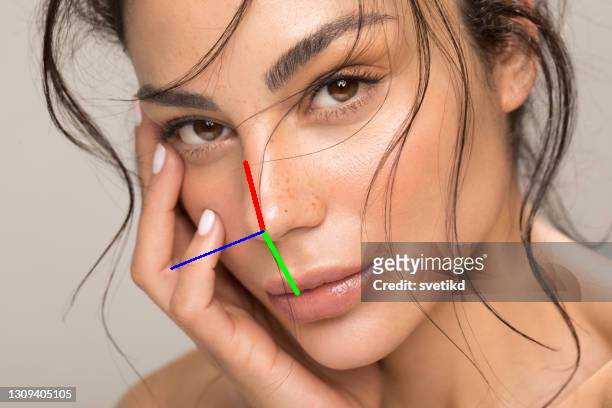

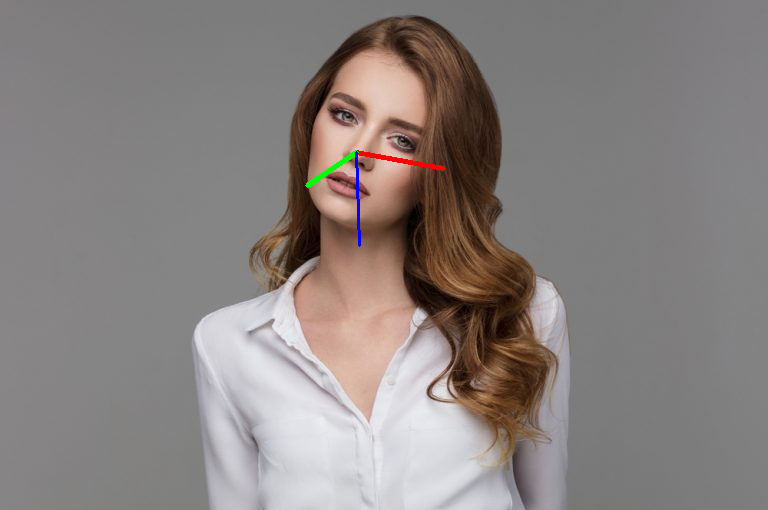

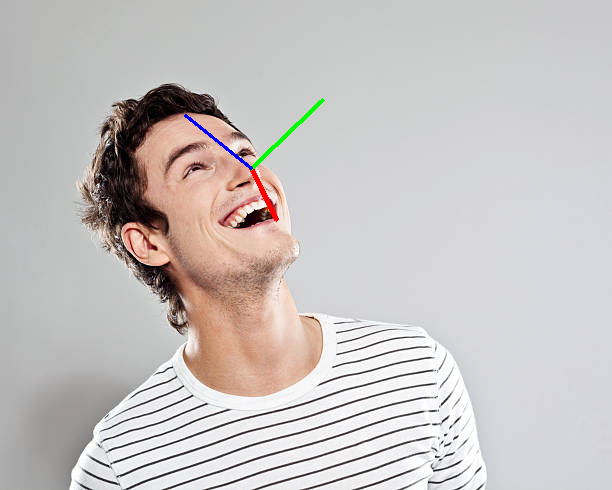

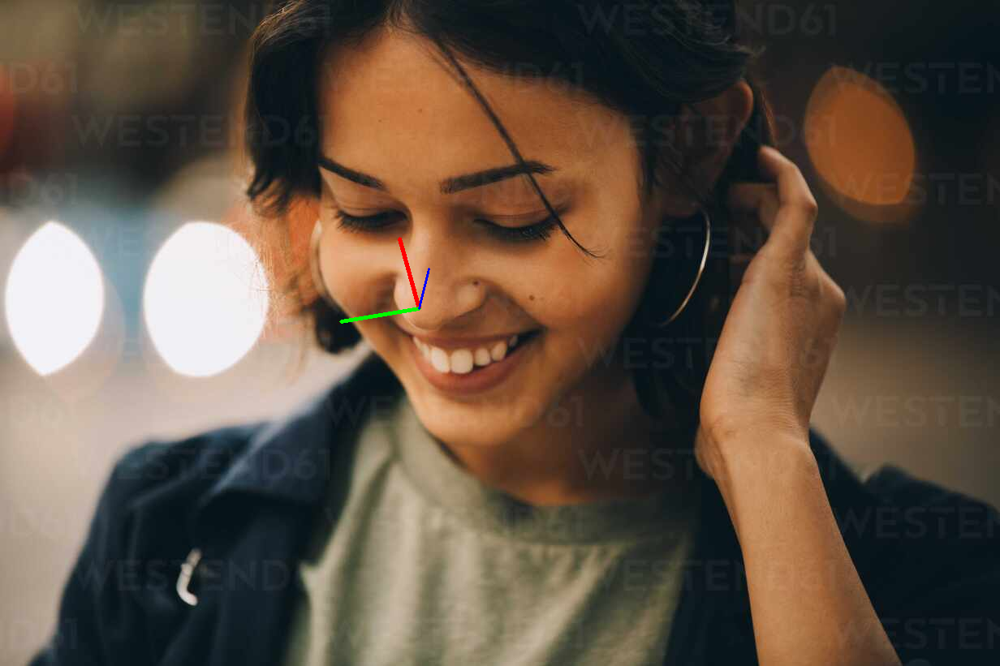

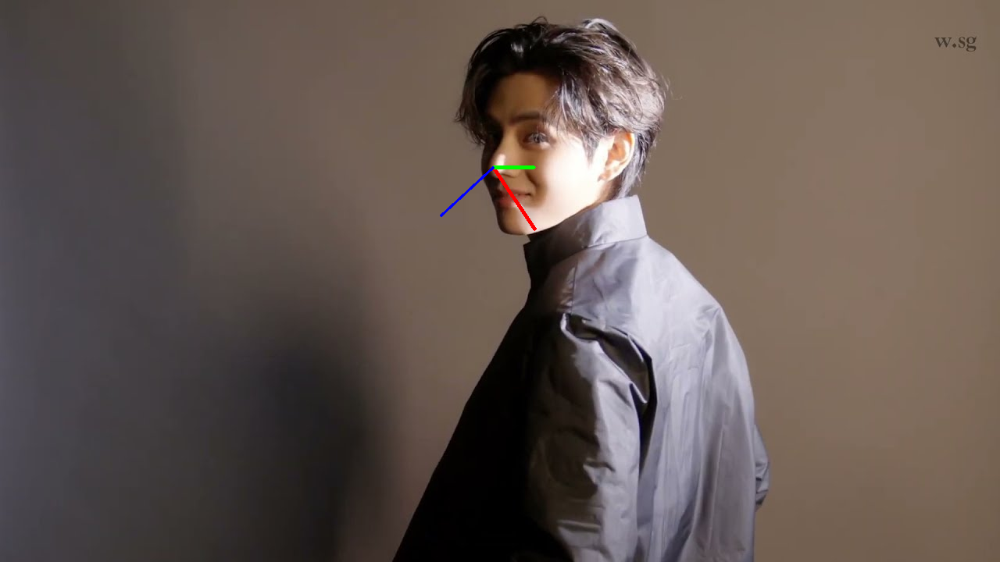

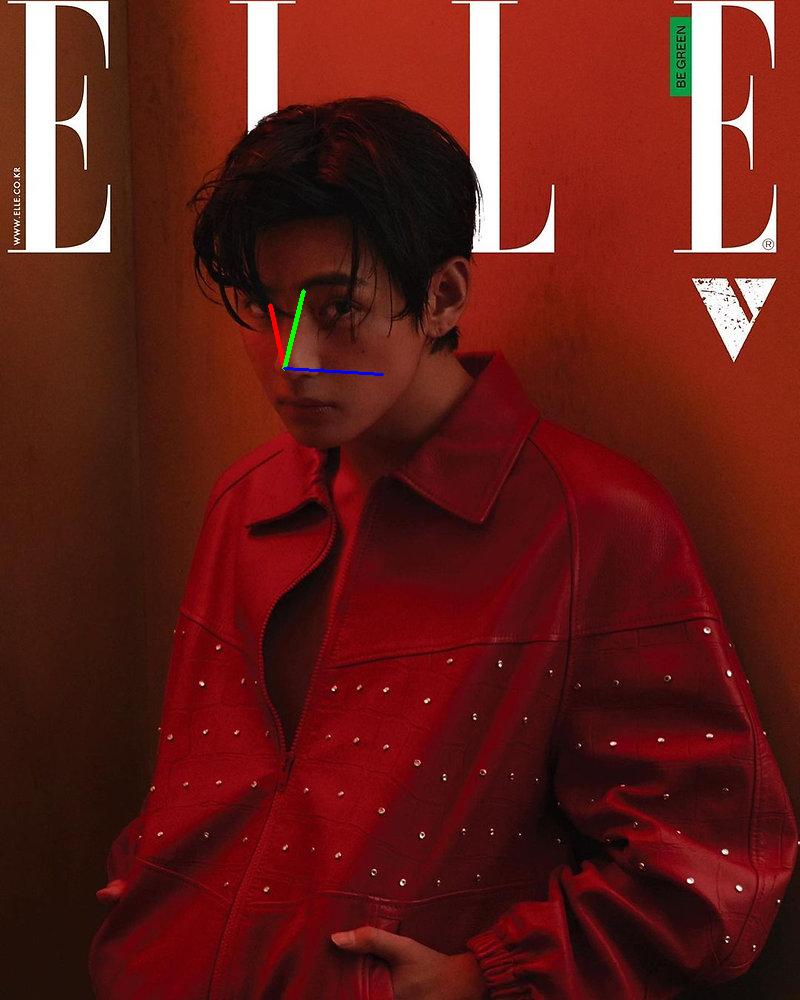

In [77]:
feature_reduction_method = lda

for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    axes_prediction(img_path, feature_reduction_method=feature_reduction_method)

##`LDA gives a very bad performance comparing to either PCA, SVD or any other feature selction technique we used in this study case because of information loss`

## LDA Drawbacks
- **Linearity Assumption**

`Issue:` LDA assumes that the relationships between the features and the classes are linear. This means it might not capture complex, non-linear relationships present in the data.

`Example:` If your dataset contains non-linear patterns, such as intricate decision boundaries in image classification, LDA may fail to distinguish between classes effectively.
<br>
<br>
- **Normal Distribution Assumption**

`Issue:` LDA assumes that the features are normally distributed within each class. If this assumption is violated, the performance of LDA may degrade.

`Example:` In cases where the features follow a skewed or multimodal distribution, such as income levels in different regions, LDA might not perform well.
<br>
<br>
- **Equal Covariance Matrices**

`Issue:` LDA assumes that the different classes have the same covariance matrix. This assumption may not hold true in many real-world datasets, leading to suboptimal results.

`Example:` When working with datasets where different classes have distinct variances, such as medical conditions with varying symptom severity, LDA might not accurately classify the data.
<br>
<br>
- **Sensitivity to Outliers**

`Issue:` LDA can be sensitive to outliers, which can significantly affect the mean and covariance estimates used in the analysis.

`Example:` In a dataset of facial landmarks where some images are significantly distorted or have extreme values, LDA might produce unreliable projections due to these outliers.
<br>
<br>
- **Scalability Issues**

`Issue:` LDA might struggle with very large datasets in terms of both the number of samples and the number of features. The computation of scatter matrices and their inversion can become infeasible.

`Example:` Applying LDA to a large-scale text dataset with thousands of features (words) and millions of samples (documents) might be computationally expensive and time-consuming.
<br>
<br>
- **Multicollinearity**

`Issue:` LDA assumes that the features are not perfectly collinear. Multicollinearity can lead to numerical instability when computing the inverse of the covariance matrix.

`Example:` In datasets where features are highly correlated, such as sensor readings from similar types of sensors, LDA might fail to find a stable solution.
<br>
<br>
- **Class Imbalance**

`Issue:` LDA can be affected by class imbalance, where one class is significantly underrepresented compared to others. This imbalance can skew the classification boundaries.

`Example:` In fraud detection datasets where fraudulent transactions are rare compared to normal transactions, LDA might be biased towards the majority class, leading to poor detection of fraudulent cases.
<br>
<br>
- **Feature Interpretability**

`Issue:` The linear combinations of features produced by LDA may not be easily interpretable, which can be a drawback in applications where feature interpretability is important.

`Example:` In medical applications, where it is crucial to understand the contribution of individual symptoms to a diagnosis, the transformed features from LDA might not provide clear insights.
<br>
<br>
- **Non-Discriminative Projections**

`Issue:` LDA aims to maximize class separability by finding linear discriminants, but it might not always find projections that are useful for subsequent tasks like regression or further analysis.

`Example:` In a dataset where you need to predict continuous outcomes (e.g., age or weight) after reducing dimensions, the LDA projections might not be optimal for regression models, as they are not designed for this purpose.

#Uniform Manifold Approximation and Projection (UMAP)
###UMAP [see doc](https://umap-learn.readthedocs.io/en/latest/sparse.html) is a dimensionality reduction technique that is particularly effective for visualizing high-dimensional data. Developed by Leland McInnes, John Healy, and James Melville, UMAP is based on manifold learning techniques and topological data analysis, providing a balance between preserving both the local and global structure of data.
<br>

##Key Concepts
- **Manifold Assumption:**
UMAP assumes that the data lies on a manifold embedded in a higher-dimensional space. It aims to learn the manifold's structure and project it into a lower-dimensional space.

- **Topology Preservation:**
UMAP constructs a topological representation of the data in the high-dimensional space and optimizes it to preserve both local and global data structure when projecting to a lower dimension.

- **Fuzzy Simplicial Complex:**
UMAP builds a fuzzy simplicial complex to represent the high-dimensional data structure. This complex captures relationships between points in terms of membership strength rather than binary connections.

- **Stochastic Optimization:**
The projection to lower dimensions is done using stochastic gradient descent to optimize the layout of points in the low-dimensional space, preserving the structure encoded in the fuzzy simplicial complex.

- **Nearest Neighbors:**
UMAP heavily relies on nearest neighbor computations to construct the initial high-dimensional graph, representing local data structure.
<br>


##UMAP Steps

- **Compute Pairwise Affinities:**
Compute the k-nearest neighbors for each point in the high-dimensional space to capture the local structure.

- **Construct Fuzzy Simplicial Set:**
Build a fuzzy simplicial set representing the high-dimensional data's topological structure using the nearest neighbors.

- **Optimize Low-Dimensional Representation:**
Use stochastic gradient descent to find an optimal layout of points in the lower-dimensional space, minimizing the difference between the high-dimensional and low-dimensional fuzzy simplicial sets.

- **Project Data:**
Project the data points into the lower-dimensional space while preserving the manifold's topological structure.
<br>

##Applications

- **Data Visualization:**
UMAP is widely used for visualizing high-dimensional data in 2D or 3D, such as image data, gene expression data, and word embeddings.

- **Cluster Analysis:**
It helps in identifying and visualizing clusters within the data by projecting high-dimensional points into a space where clusters can be visually inspected.

- **Exploratory Data Analysis (EDA):**
UMAP is a powerful tool for EDA, allowing data scientists to gain insights into the structure and relationships within the data.

- **Preprocessing for Other Algorithms:**
UMAP can be used as a preprocessing step to reduce the dimensionality of data before applying other machine learning algorithms, improving their performance and reducing computational cost.

In [79]:
# Separate features and targets
X = df.drop(columns=['pitch', 'yaw', 'roll'])
y = df[['pitch', 'yaw', 'roll']]

# Apply UMAP for dimensionality reduction
reducer = umap.UMAP(n_components=25, random_state=42, set_op_mix_ratio=0.5)
X_reduced = reducer.fit_transform(X)

In [78]:
# Create a new DataFrame with the autoencoder components
features_encoder_df = pd.DataFrame(X_reduced, columns=[f'ENC{i+1}' for i in range(X_reduced.shape[1])])

# Combine the LDA features with the target variables
encoder_df = pd.concat([features_encoder_df, y.reset_index(drop=True)], axis=1)
encoder_df

,ENC1,ENC2,ENC3,ENC4,ENC5,ENC6,ENC7,ENC8,ENC9,ENC10,...,ENC19,ENC20,ENC21,ENC22,ENC23,ENC24,ENC25,pitch,yaw,roll
0,5119.074081,-5021.399208,-523.787026,333.540004,871.955965,425.619427,-43.168622,-219.182176,-81.716570,26.556698,...,-19.021934,11.268049,5.580251,-6.364049,5.886777,24.596735,-22.837518,-1.108159,-1.443685,1.129171
1,4847.627160,1712.015579,410.813510,1061.227461,-76.804886,-210.517083,-91.584607,99.773869,41.340368,16.104846,...,-2.538106,3.988232,-15.786654,3.353302,-12.489374,-16.688706,16.972941,-0.373085,0.293578,-0.125011
2,4824.601191,-298.256196,148.146814,1439.987067,-390.503693,48.283567,-130.319030,9.412081,-14.963269,0.141110,...,-0.199458,0.251600,-41.545208,6.466924,-0.205879,14.011627,19.059836,-0.474087,-0.040907,0.019801
3,4733.537620,-1287.190569,-547.515193,305.850108,-402.305197,63.506824,280.863129,-111.227135,-30.584714,89.153741,...,2.680325,7.062604,1.062493,-7.664967,-13.785424,-6.292128,-5.434470,-0.116700,-0.233745,0.095809
4,4837.600044,-5154.163832,194.471195,-83.457588,915.341864,293.174050,-112.780420,-86.397587,44.059317,-85.430860,...,-12.964633,15.721566,16.946281,4.778474,8.854500,20.138202,2.544942,-0.379067,-0.985426,0.086955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,4820.067047,-3272.525847,-343.778466,513.961619,439.638140,325.049385,-108.312908,8.141457,25.171053,-1.624018,...,13.090798,23.158295,-26.547403,3.521369,-3.155936,5.462862,-2.127941,-0.266459,-0.722653,0.219750
1849,4896.716515,504.945199,-332.998602,562.329060,-359.572684,9.808849,-58.665714,-59.514058,-19.823108,-51.893617,...,15.289498,-7.700261,-4.883315,-0.522927,7.927335,4.253729,1.361859,-0.161717,0.085792,0.027202
1850,4959.415997,2179.765558,48.424540,-316.018562,-220.963224,-20.150523,294.870141,-39.643430,3.541284,-152.411154,...,15.211328,10.172170,-8.122715,22.991567,6.221900,13.734216,-7.763475,-0.046365,0.580349,-0.023616
1851,4734.435800,-1148.806649,433.127109,-814.338037,90.501796,-158.037943,13.160390,-32.813661,-69.699804,50.039573,...,-25.429440,22.761182,-28.560544,27.303204,-16.775435,12.773071,2.408405,-0.948136,-1.241852,1.234426


## Hyper-paramter Tuning

In [80]:
pitch = encoder_df[['pitch']]
yaw = encoder_df[['yaw']]
roll = encoder_df[['roll']]
features = encoder_df.drop(['pitch', 'yaw', 'roll'], axis=1)
labels = encoder_df[['pitch', 'yaw', 'roll']]

- pitch model tuning

In [81]:
optimize_huber_regressor(features, pitch, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:14:10,761] A new study created in memory with name: no-name-31c398e0-860d-48ae-aff4-f3144087e34d
[I 2024-06-02 09:14:11,564] Trial 0 finished with value: 0.29665087298455517 and parameters: {'epsilon': 1.3038902997864072, 'alpha': 5.516768387685878, 'fit_intercept': False, 'max_iter': 329}. Best is trial 0 with value: 0.29665087298455517.
[I 2024-06-02 09:14:12,466] Trial 1 finished with value: 0.30621870442530796 and parameters: {'epsilon': 1.358170584884835, 'alpha': 1.8145488443954052, 'fit_intercept': True, 'max_iter': 384}. Best is trial 0 with value: 0.29665087298455517.
[I 2024-06-02 09:14:12,930] Trial 2 finished with value: 0.16322583207568844 and parameters: {'epsilon': 1.9490344338451786, 'alpha': 0.0022901729593955236, 'fit_intercept': False, 'max_iter': 193}. Best is trial 2 with value: 0.16322583207568844.
[I 2024-06-02 09:14:14,708] Trial 3 finished with value: 0.1477660869166524 and parameters: {'epsilon': 1.8537128085898447, 'alpha': 29.88689474188621,

Best Hyperparameters: {'epsilon': 1.9818753557293138, 'alpha': 0.04200202672807374, 'fit_intercept': False, 'max_iter': 766}
Best Validation RMSE: 0.13319789505416374


- yaw model tuning

In [82]:
optimize_huber_regressor(features, yaw, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:16:04,407] A new study created in memory with name: no-name-d515ec26-1744-4fe5-a277-3bfa619c0fd2
[I 2024-06-02 09:16:05,115] Trial 0 finished with value: 0.16180140598816536 and parameters: {'epsilon': 1.244068337878908, 'alpha': 2.7680194393031377, 'fit_intercept': True, 'max_iter': 514}. Best is trial 0 with value: 0.16180140598816536.
[I 2024-06-02 09:16:06,398] Trial 1 finished with value: 0.1286239090739694 and parameters: {'epsilon': 1.8948021583226877, 'alpha': 5.556743925342086, 'fit_intercept': True, 'max_iter': 893}. Best is trial 1 with value: 0.1286239090739694.
[I 2024-06-02 09:16:07,794] Trial 2 finished with value: 0.12761293329860304 and parameters: {'epsilon': 1.3663602795187257, 'alpha': 0.003885116498292218, 'fit_intercept': True, 'max_iter': 823}. Best is trial 2 with value: 0.12761293329860304.
[I 2024-06-02 09:16:08,944] Trial 3 finished with value: 0.12854127367234763 and parameters: {'epsilon': 1.8959094656504465, 'alpha': 0.11217504366575792, '

Best Hyperparameters: {'epsilon': 1.8505761537574306, 'alpha': 11.257396619931887, 'fit_intercept': True, 'max_iter': 923}
Best Validation RMSE: 0.1246595700180927


- roll model tuning

In [83]:
optimize_huber_regressor(features, roll, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:17:23,000] A new study created in memory with name: no-name-8b7300c5-6766-4c3c-b1b2-41a3f274e6fe
[I 2024-06-02 09:17:23,675] Trial 0 finished with value: 0.14160214654022446 and parameters: {'epsilon': 1.7439584178802208, 'alpha': 0.25786962095754945, 'fit_intercept': False, 'max_iter': 964}. Best is trial 0 with value: 0.14160214654022446.
[I 2024-06-02 09:17:23,836] Trial 1 finished with value: 0.26202097322965123 and parameters: {'epsilon': 1.1445338187041556, 'alpha': 0.013998395564324546, 'fit_intercept': False, 'max_iter': 242}. Best is trial 0 with value: 0.14160214654022446.
[I 2024-06-02 09:17:24,287] Trial 2 finished with value: 0.14423641404353585 and parameters: {'epsilon': 1.2664006333334388, 'alpha': 2.773611416277184, 'fit_intercept': True, 'max_iter': 680}. Best is trial 0 with value: 0.14160214654022446.
[I 2024-06-02 09:17:24,555] Trial 3 finished with value: 0.32845682779242547 and parameters: {'epsilon': 1.435601081474568, 'alpha': 17.42373419679666

Best Hyperparameters: {'epsilon': 1.7309484796078805, 'alpha': 4.400926553341336, 'fit_intercept': False, 'max_iter': 687}
Best Validation RMSE: 0.13751981931317311


multi-model tuning

In [84]:
optimize_multi_huber_regressor(features, labels, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:18:30,631] A new study created in memory with name: no-name-7df51383-b8e5-4bc5-928f-63d8f09ff9e3
[I 2024-06-02 09:18:31,065] Trial 0 finished with value: 0.2015977399817502 and parameters: {'epsilon': 1.831095696639613, 'alpha': 0.024982117040678643, 'fit_intercept': False, 'max_iter': 224}. Best is trial 0 with value: 0.2015977399817502.
[I 2024-06-02 09:18:31,522] Trial 1 finished with value: 0.19830659749135005 and parameters: {'epsilon': 1.1727308395358944, 'alpha': 511.4727066368404, 'fit_intercept': True, 'max_iter': 202}. Best is trial 1 with value: 0.19830659749135005.
[I 2024-06-02 09:18:32,229] Trial 2 finished with value: 0.33914192479472677 and parameters: {'epsilon': 1.7748987160048395, 'alpha': 14.512207087185576, 'fit_intercept': False, 'max_iter': 355}. Best is trial 1 with value: 0.19830659749135005.
[I 2024-06-02 09:18:33,447] Trial 3 finished with value: 0.20548275077259912 and parameters: {'epsilon': 1.6775115783378682, 'alpha': 0.7348948103602774, 

Best Hyperparameters: {'epsilon': 1.9972256343044017, 'alpha': 0.0010177240939335335, 'fit_intercept': False, 'max_iter': 963}
Best Validation RMSE: 0.13429002225325645


## `it gives a small RMES similar to SVD`

## Test on photos

In [86]:
# initiaize 3 models
pitch_model = HuberRegressor(epsilon=1.9818753557293138, alpha=0.04200202672807374, fit_intercept=False, max_iter=766)
yaw_model = HuberRegressor(epsilon=1.8505761537574306, alpha=11.257396619931887, fit_intercept=True, max_iter=923)
roll_model = HuberRegressor(epsilon=1.7309484796078805, alpha=4.400926553341336, fit_intercept=False, max_iter=687)

train_predict_evaluate(pitch_model, yaw_model, roll_model, encoder_df)

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.3038, Test: 0.0177
R-squared (R2) - Train: 0.1494, Test: 0.7763


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.0514, Test: 0.0155
R-squared (R2) - Train: 0.8488, Test: 0.9510


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.3825, Test: 0.0189
R-squared (R2) - Train: 0.2317, Test: 0.8351


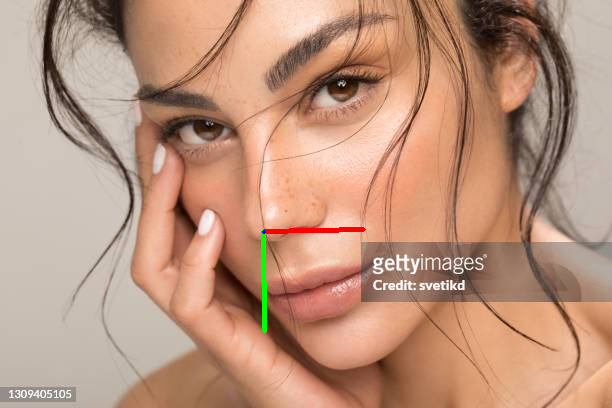

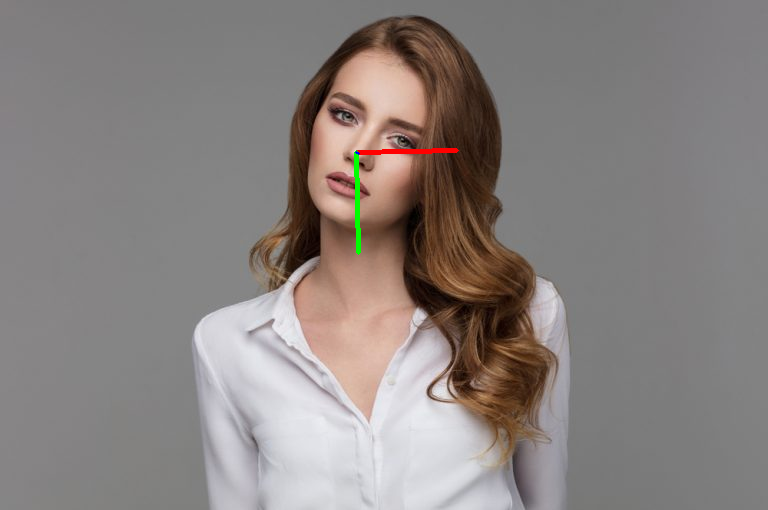

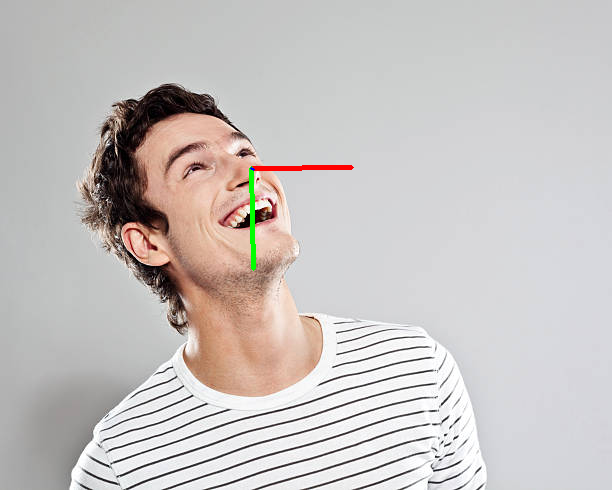

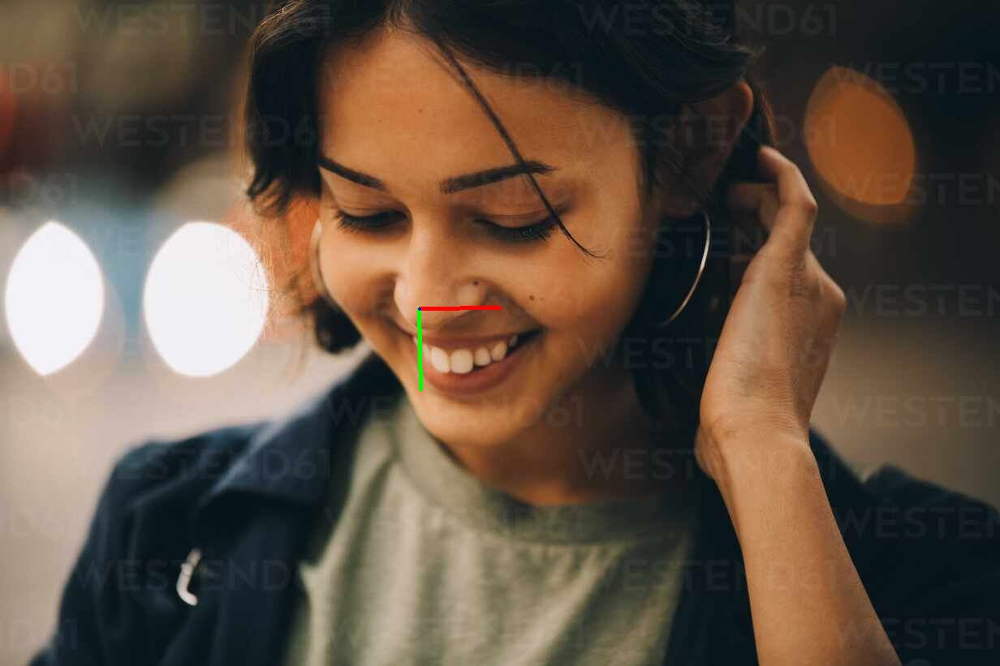

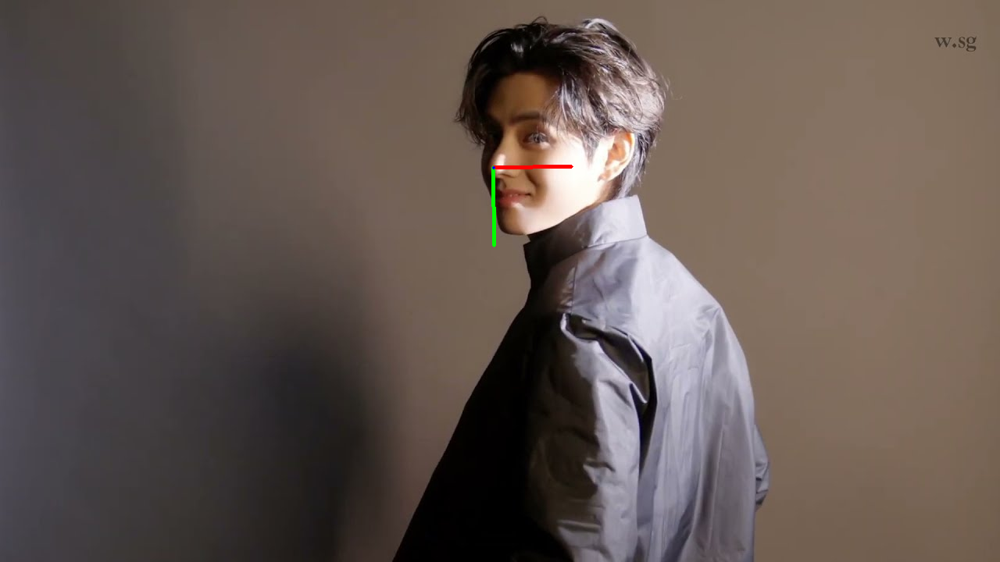

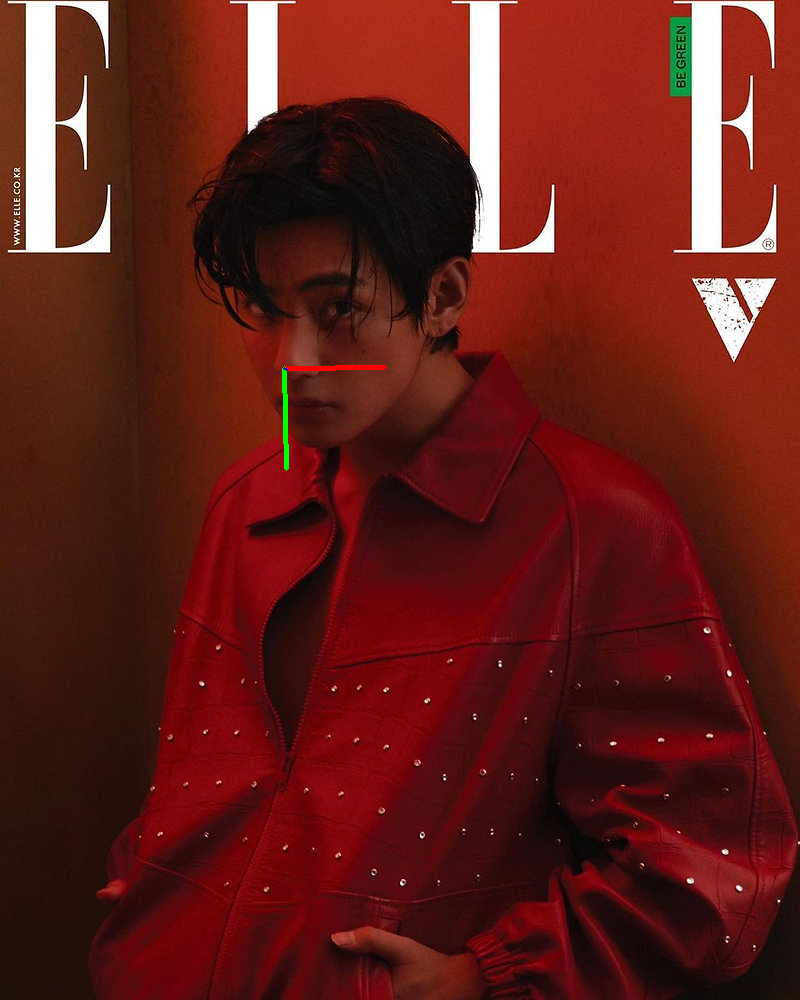

In [87]:
feature_reduction_method = reducer

for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    axes_prediction(img_path, feature_reduction_method=feature_reduction_method)

## `but its proformance is fixed`

## UMAP Drawbacks
- **Computational Complexity:**
While UMAP is faster than some other techniques like t-SNE, it can still be computationally intensive, particularly for very large datasets.

- **Parameter Sensitivity:**
UMAP requires careful tuning of hyperparameters such as the number of neighbors (n_neighbors) and the minimum distance (min_dist). Different parameter settings can lead to significantly different results.

- **Interpretability:**
Similar to other manifold learning techniques, the low-dimensional representation created by UMAP is not easily interpretable in terms of the original features, making it less useful for tasks requiring clear feature contributions.

- **Stochastic Nature:**
The optimization process in UMAP involves stochastic gradient descent, which can lead to variability in results between different runs.

- **Data Sparsity:**
UMAP can struggle with sparse data, as the construction of the nearest neighbor graph might not accurately capture the underlying structure when many features have zero values.

# Autoencoders
##Autoencoders [see doc](https://www.tensorflow.org/tutorials/generative/autoencoder) are a type of artificial neural network used for unsupervised learning of efficient codings. They are primarily used for dimensionality reduction, denoising, and learning generative models of data. Autoencoders work by compressing the input into a latent-space representation and then reconstructing the output from this representation.
<br>

##Key Concepts
### 1. Architecture:
- **Encoder:** Maps the input data to a latent-space representation (a compressed version of the input).

- **Latent Space:** The bottleneck layer (also called the code or latent representation) where the dimensionality is reduced.

- **Decoder:** Maps the latent-space representation back to the original input space.

### 2. Loss Function:
- Measures the difference between the input and the reconstructed output. Common loss functions include Mean Squared Error (MSE) for continuous data and Binary Cross-Entropy for binary data.

### 3. Training:
- The autoencoder is trained to minimize the reconstruction error, effectively learning how to compress and decompress the data.
<br>

##Autoencoders Steps
- **Prepare Data:**
Normalize or standardize the data.

- **Define the Autoencoder Architecture:**
Design the encoder and decoder networks, typically using fully connected (dense) layers for tabular data.

- **Train the Autoencoder:**
Use the input data as both input and output to train the network.

- **Extract Features:**
After training, use the encoder part of the autoencoder to transform the input data into its lower-dimensional representation.

In [106]:
# Separate features and targets
X = df.drop(columns=['pitch', 'yaw', 'roll'])
y = df[['pitch', 'yaw', 'roll']]

# Standardize the data
scaler = StandardScaler()
data = scaler.fit_transform(X)

# Define the autoencoder architecture
input_dim = data.shape[1]
encoding_dim = 25  # Dimension of the latent space representation

# Set the encoding dimension
input_layer = keras.layers.Input(shape=(input_dim,))
encoder = keras.layers.Dense(encoding_dim, activation="relu")(input_layer)
decoder = keras.layers.Dense(input_dim, activation="sigmoid")(encoder)
autoencoder = keras.Model(inputs=input_layer, outputs=decoder)

# Compile the autoencoder
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the autoencoder architecture
autoencoder.summary()

Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 936)]             0         
                                                                 
 dense_16 (Dense)            (None, 25)                23425     
                                                                 
 dense_17 (Dense)            (None, 936)               24336     
                                                                 
Total params: 47761 (186.57 KB)
Trainable params: 47761 (186.57 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [107]:
# Train the autoencoder
autoencoder.fit(data, data, epochs=100, batch_size=32, shuffle=True)

Epoch 1/100
58/58 [==============================] - 1s 3ms/step - loss: 0.8910
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 0.6522
Epoch 3/100
58/58 [==============================] - 0s 3ms/step - loss: 0.6275
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 0.6189
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 0.6135
Epoch 6/100
58/58 [==============================] - 0s 3ms/step - loss: 0.6096
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 0.6065
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 0.6038
Epoch 9/100
58/58 [==============================] - 0s 4ms/step - loss: 0.6019
Epoch 10/100
58/58 [==============================] - 0s 4ms/step - loss: 0.6005
Epoch 11/100
58/58 [==============================] - 0s 4ms/step - loss: 0.5993
Epoch 12/100
58/58 [==============================] - 0s 4ms/step - loss: 0.5985
Epoch 13/100
58/58 [=================

In [108]:
# Use encoder part of the autoencoder for feature selection
encoder = keras.Model(inputs=autoencoder.input, outputs=autoencoder.layers[1].output)
encoded_train = encoder.predict(data)
encoded_train.shape

58/58 [==============================] - 0s 3ms/step


(1853, 25)

In [109]:
# Create a new DataFrame with the autoencoder components
features_encoder_df = pd.DataFrame(encoded_train, columns=[f'ENC{i+1}' for i in range(encoded_train.shape[1])])

# Combine the LDA features with the target variables
encoder_df = pd.concat([features_encoder_df, y.reset_index(drop=True)], axis=1)
encoder_df

,ENC1,ENC2,ENC3,ENC4,ENC5,ENC6,ENC7,ENC8,ENC9,ENC10,...,ENC19,ENC20,ENC21,ENC22,ENC23,ENC24,ENC25,pitch,yaw,roll
0,15.150439,0.000000,37.398342,31.035992,34.348202,0.000000,0.000000,50.953522,8.096674,0.235557,...,10.231006,1.999375,0.000000,37.848007,31.152561,56.742344,9.084822,-1.108159,-1.443685,1.129171
1,2.329903,1.096482,0.000000,0.000000,0.000000,4.228868,18.103670,0.870435,0.000000,7.346934,...,0.000000,2.587649,25.721132,0.000000,0.000000,0.000000,1.974302,-0.373085,0.293578,-0.125011
2,17.587246,13.932251,5.228176,6.285508,0.000000,4.998443,7.794387,25.137802,0.000000,9.927947,...,0.000000,8.789389,22.669832,4.269213,0.000000,1.765899,0.978254,-0.474087,-0.040907,0.019801
3,2.068959,12.446064,7.028182,19.686600,13.115565,12.605598,0.000000,14.038559,0.000000,4.379580,...,0.000000,3.149568,0.000000,12.394559,3.650952,9.841937,0.043541,-0.116700,-0.233745,0.095809
4,20.689560,0.000000,29.259087,29.095812,34.993969,0.487416,0.000000,48.798035,9.257675,0.000000,...,31.937597,6.681431,0.000000,42.930027,34.969406,62.136169,10.443327,-0.379067,-0.985426,0.086955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,16.447557,0.917855,23.825296,24.654589,18.395826,0.000000,0.000000,36.317001,0.533390,1.121310,...,3.657003,8.454638,0.000000,24.847597,15.373546,37.695923,7.506307,-0.266459,-0.722653,0.219750
1849,0.246239,5.835282,2.685392,1.291608,0.000000,5.956270,4.055036,4.877843,0.000000,7.254028,...,0.000000,1.683798,12.673770,0.000000,0.000000,0.000000,3.085154,-0.161717,0.085792,0.027202
1850,0.000000,0.000000,0.000000,0.000000,0.000000,11.608283,8.977633,0.000000,11.593775,2.323617,...,0.000000,0.000000,11.263405,0.000000,0.000000,0.000000,0.000000,-0.046365,0.580349,-0.023616
1851,2.202994,0.000000,7.346931,3.951104,18.560366,2.211456,0.000000,0.000000,0.650096,6.457354,...,25.262423,0.810881,0.000000,11.753009,19.802357,15.359114,3.020328,-0.948136,-1.241852,1.234426


## Hyper-parameter tuning

In [110]:
pitch = encoder_df[['pitch']]
yaw = encoder_df[['yaw']]
roll = encoder_df[['roll']]
features = encoder_df.drop(['pitch', 'yaw', 'roll'], axis=1)
labels = encoder_df[['pitch', 'yaw', 'roll']]

- pitch model tuning

In [111]:
optimize_huber_regressor(features, pitch, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:55:28,798] A new study created in memory with name: no-name-878c90a2-f85b-4bf0-aa1f-6ed3c7c69b3a
[I 2024-06-02 09:55:29,375] Trial 0 finished with value: 0.13804879711583193 and parameters: {'epsilon': 1.2432794688955973, 'alpha': 1.60771706468111, 'fit_intercept': True, 'max_iter': 314}. Best is trial 0 with value: 0.13804879711583193.
[I 2024-06-02 09:55:29,892] Trial 1 finished with value: 0.13901106272433839 and parameters: {'epsilon': 1.46103790274287, 'alpha': 1.0746125151140782, 'fit_intercept': False, 'max_iter': 944}. Best is trial 0 with value: 0.13804879711583193.
[I 2024-06-02 09:55:30,325] Trial 2 finished with value: 0.1389800896014491 and parameters: {'epsilon': 1.6000612779365664, 'alpha': 10.965742068401195, 'fit_intercept': False, 'max_iter': 695}. Best is trial 0 with value: 0.13804879711583193.
[I 2024-06-02 09:55:31,105] Trial 3 finished with value: 0.13830404549689349 and parameters: {'epsilon': 1.1542213308704226, 'alpha': 0.10244480621623683, 'f

Best Hyperparameters: {'epsilon': 1.6287312116134305, 'alpha': 235.68416151814338, 'fit_intercept': True, 'max_iter': 313}
Best Validation RMSE: 0.1375464702033808


- yaw model tuning

In [112]:
optimize_huber_regressor(features, yaw, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:56:30,260] A new study created in memory with name: no-name-e0f30981-6ab4-42dc-9d2f-972d39be4063
[I 2024-06-02 09:56:30,614] Trial 0 finished with value: 0.13214592977102707 and parameters: {'epsilon': 1.7149653986533204, 'alpha': 0.006758007046632773, 'fit_intercept': False, 'max_iter': 797}. Best is trial 0 with value: 0.13214592977102707.
[I 2024-06-02 09:56:31,051] Trial 1 finished with value: 0.13240382094444336 and parameters: {'epsilon': 1.3988822161647478, 'alpha': 33.79086656407037, 'fit_intercept': False, 'max_iter': 338}. Best is trial 0 with value: 0.13214592977102707.
[I 2024-06-02 09:56:31,416] Trial 2 finished with value: 0.1320441770655362 and parameters: {'epsilon': 1.8578610410075593, 'alpha': 0.0021892967042551116, 'fit_intercept': False, 'max_iter': 420}. Best is trial 2 with value: 0.1320441770655362.
[I 2024-06-02 09:56:31,949] Trial 3 finished with value: 0.1322264877457602 and parameters: {'epsilon': 1.5904771561517859, 'alpha': 191.468061657569

Best Hyperparameters: {'epsilon': 1.51888242752582, 'alpha': 0.025861378040717923, 'fit_intercept': True, 'max_iter': 169}
Best Validation RMSE: 0.13181320086865977


- roll model tuning

In [114]:
optimize_huber_regressor(features, roll, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:59:47,680] A new study created in memory with name: no-name-1cf353b8-3966-45b9-9a64-a6c6fee5f5b4
[I 2024-06-02 09:59:47,809] Trial 0 finished with value: 0.13812522888981532 and parameters: {'epsilon': 1.5382647825504066, 'alpha': 0.06941918691091706, 'fit_intercept': True, 'max_iter': 137}. Best is trial 0 with value: 0.13812522888981532.
[I 2024-06-02 09:59:47,969] Trial 1 finished with value: 0.13797032971751552 and parameters: {'epsilon': 1.506480569784005, 'alpha': 43.91900860266058, 'fit_intercept': True, 'max_iter': 174}. Best is trial 1 with value: 0.13797032971751552.
[I 2024-06-02 09:59:48,128] Trial 2 finished with value: 0.13741409765618984 and parameters: {'epsilon': 1.8082092259267561, 'alpha': 2.928889758448408, 'fit_intercept': False, 'max_iter': 848}. Best is trial 2 with value: 0.13741409765618984.
[I 2024-06-02 09:59:48,241] Trial 3 finished with value: 0.13717110850180295 and parameters: {'epsilon': 1.8272350314204633, 'alpha': 0.024060575036603846,

Best Hyperparameters: {'epsilon': 1.998990012616942, 'alpha': 2.2516620151376743, 'fit_intercept': True, 'max_iter': 833}
Best Validation RMSE: 0.13443917248726747


- multi-model tuning

In [113]:
optimize_multi_huber_regressor(features, labels, test_size=0.2, random_state=42, n_trials=100)

[I 2024-06-02 09:57:10,128] A new study created in memory with name: no-name-7d617bf9-125d-4f32-bf6b-2b4d059644f8
[I 2024-06-02 09:57:11,177] Trial 0 finished with value: 0.13704658582120083 and parameters: {'epsilon': 1.2864003786978575, 'alpha': 0.5681830864521276, 'fit_intercept': False, 'max_iter': 345}. Best is trial 0 with value: 0.13704658582120083.
[I 2024-06-02 09:57:12,112] Trial 1 finished with value: 0.1361343509125242 and parameters: {'epsilon': 1.9456795881969895, 'alpha': 0.0011623336180296084, 'fit_intercept': False, 'max_iter': 207}. Best is trial 1 with value: 0.1361343509125242.
[I 2024-06-02 09:57:13,636] Trial 2 finished with value: 0.13489390112493094 and parameters: {'epsilon': 1.9011814206110291, 'alpha': 320.3748342477706, 'fit_intercept': True, 'max_iter': 809}. Best is trial 2 with value: 0.13489390112493094.
[I 2024-06-02 09:57:15,382] Trial 3 finished with value: 0.13567947131120375 and parameters: {'epsilon': 1.3849872958714313, 'alpha': 202.4025854553586,

Best Hyperparameters: {'epsilon': 1.9928691523838802, 'alpha': 41.22907792425713, 'fit_intercept': True, 'max_iter': 858}
Best Validation RMSE: 0.13482697749066935


## `it gives a good RMES`

## Test on photos

In [115]:
# initiaize 3 models
pitch_model = HuberRegressor(epsilon=1.6287312116134305, alpha=235.68416151814338, fit_intercept=True, max_iter=313)
yaw_model = HuberRegressor(epsilon=1.51888242752582, alpha=0.025861378040717923, fit_intercept=True, max_iter=169)
roll_model = HuberRegressor(epsilon=1.998990012616942, alpha=2.2516620151376743, fit_intercept=True, max_iter=833)

train_predict_evaluate(pitch_model, yaw_model, roll_model, encoder_df)

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.3014, Test: 0.0189
R-squared (R2) - Train: 0.1561, Test: 0.7615


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.0520, Test: 0.0174
R-squared (R2) - Train: 0.8471, Test: 0.9452


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.3794, Test: 0.0181
R-squared (R2) - Train: 0.2379, Test: 0.8424


1/1 [==============================] - 0s 49ms/step


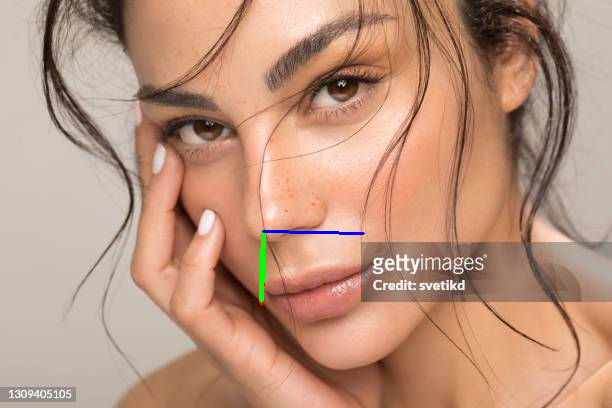

1/1 [==============================] - 0s 27ms/step


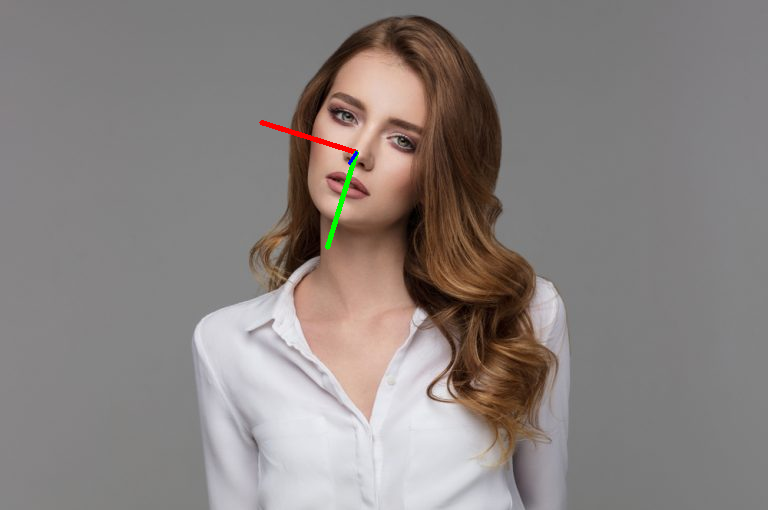

1/1 [==============================] - 0s 21ms/step


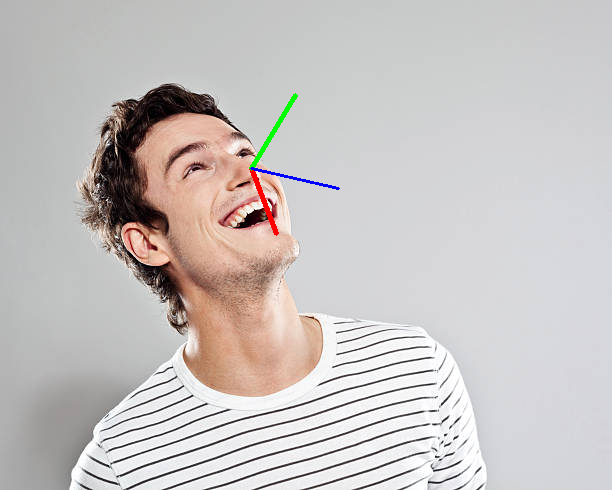

1/1 [==============================] - 0s 18ms/step


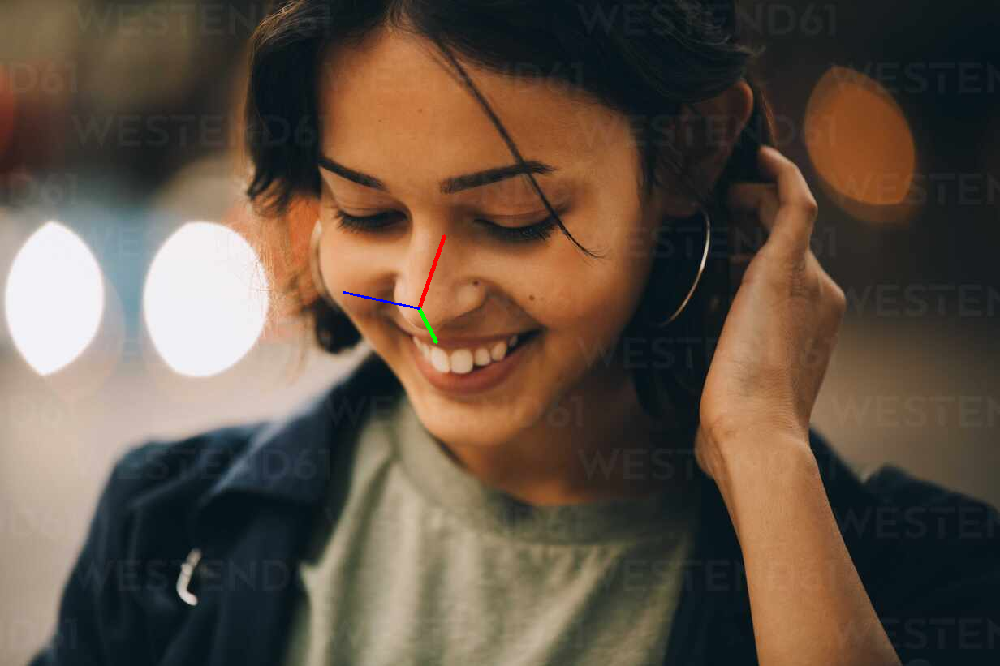

1/1 [==============================] - 0s 26ms/step


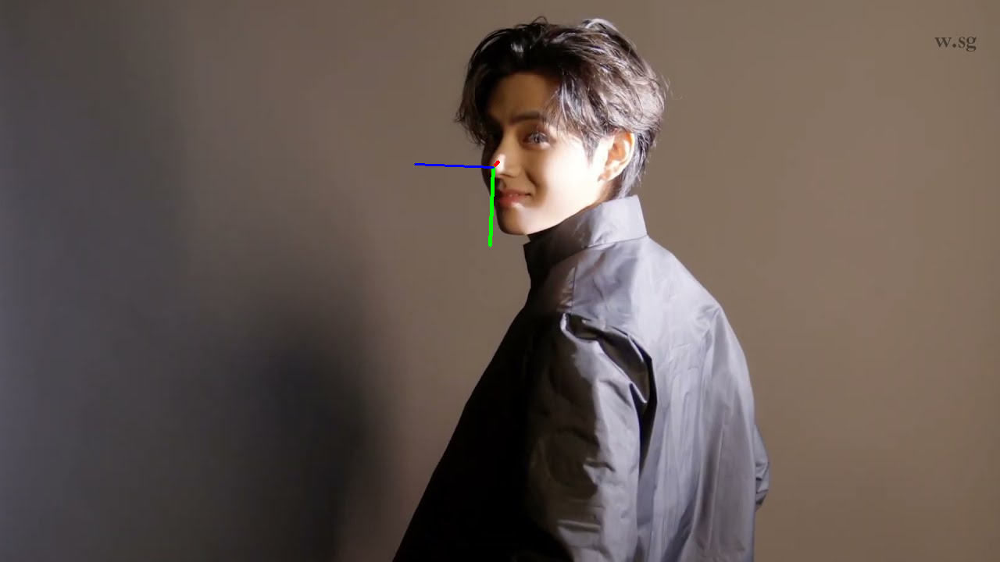

1/1 [==============================] - 0s 33ms/step


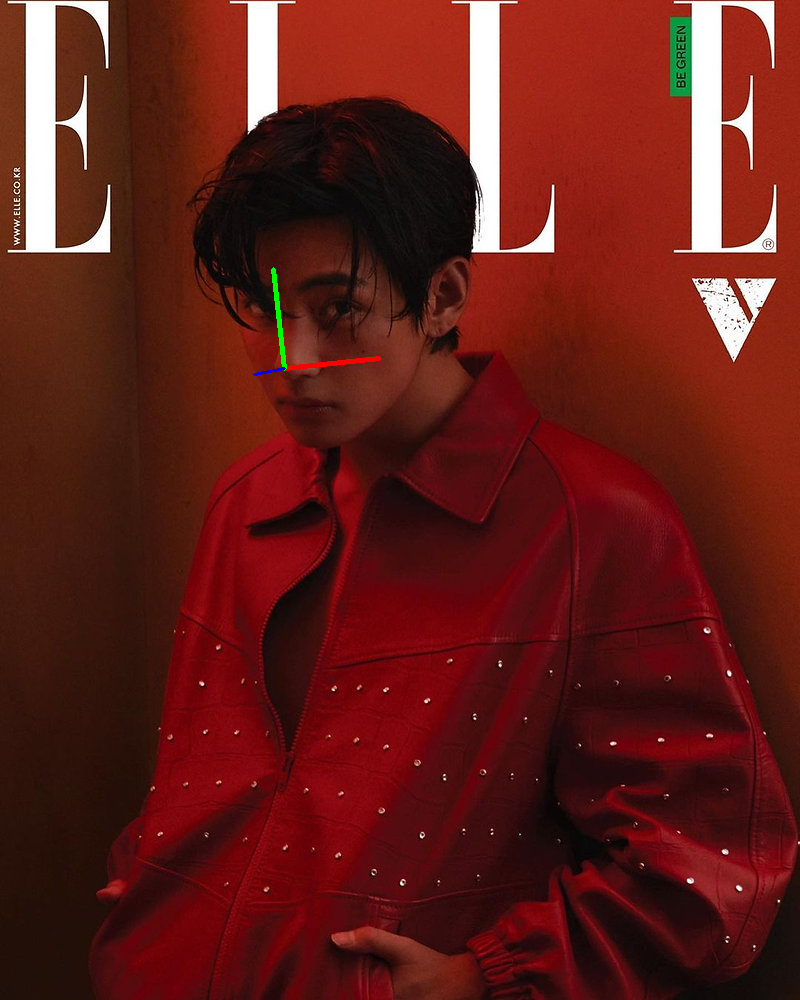

In [118]:
feature_reduction_method = encoder

for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    axes_prediction(img_path, feature_reduction_method=feature_reduction_method)

## `but its performance is not good for this study case`

##Autoencoder Drawbacks
- **Computational Complexity**

`Issue:` Training autoencoders can be computationally intensive, especially for large datasets or complex network architectures. <br>
`Example:` Training an autoencoder on high-resolution image datasets (e.g., for medical imaging) requires significant computational resources and time, which may not be feasible for all applications.
<br>
<br>

- **Overfitting**

`Issue:` Autoencoders can overfit the training data, especially if the network is too large relative to the size of the dataset.

`Example:` When applied to small datasets, an autoencoder might memorize the training data rather than learning meaningful representations, leading to poor generalization on new data.
<br>
<br>
- **Interpretability**

`Issue:` The latent space representations learned by autoencoders are often difficult to interpret.

`Example:` In fields where interpretability is crucial (e.g., healthcare or finance), stakeholders may find it challenging to understand and trust the learned representations, limiting the practical utility of autoencoders.
<br>
<br>
- **Sensitivity to Hyperparameters**

`Issue:` The performance of autoencoders is highly sensitive to the choice of hyperparameters, such as the number of layers, number of neurons, learning rate, and regularization parameters.

`Example:` Finding the optimal set of hyperparameters for an autoencoder can be time-consuming and requires extensive experimentation, especially for datasets with complex structures.
<br>
<br>
- **Data Requirements**

`Issue:` Autoencoders require a large amount of data to train effectively, particularly for deep architectures.

`Example:` In scenarios where labeled data is scarce (such as specific medical conditions or rare events), it can be challenging to collect sufficient data to train an effective autoencoder.
<br>
<br>
- **Reconstruction Quality**

`Issue:` Autoencoders may struggle to accurately reconstruct complex data structures or capture intricate details in the input data.

`Example:` For tasks requiring high-fidelity reconstructions (like fine-grained image details), autoencoders might not achieve the desired quality, leading to loss of important information.
<br>
<br>
- **Lack of Invariance**

`Issue:` Standard autoencoders do not inherently provide invariance to transformations such as translation, rotation, or scaling.

`Example:` In image processing tasks, slight variations in the input images (like different angles or lighting conditions) can significantly affect the latent space representation and reconstruction quality.



---


# Conclusion

##The whole purpose was to discover how dealing with features can affect the performance of any problem.

##There's no right solution except try and error, as with exploring features effect we can estimate the best solution and not a one solution for all the study case (if it's a multi-regressor or classification), we can handle each model with a certain approach to give the best performance.

